In [1]:
import pandas as pd
from ydata_profiling import ProfileReport
from scipy import signal
from sklearn.decomposition import PCA

# Exploración de los datos:

Se van a hacer exploraciones de forma preliminar 

Se tienen 3 fuentes de datos en el notebook se vera una por una.

- **eeg_id**: A unique identifier for the entire EEG recording.
- **eeg_sub_id**: An ID for the specific 50-second long subsample this row's labels apply to.
- **eeg_label_offset_seconds**: The time between the beginning of the consolidated EEG and this subsample.
- **spectrogram_id**: A unique identifier for the entire EEG recording.
- **spectrogram_sub_id**: An ID for the specific 10-minute subsample this row's labels apply to.
- **spectrogram_label_offset_seconds**: The time between the beginning of the consolidated spectrogram and this subsample.
- **label_id**: An ID for this set of labels.
- **patient_id**: An ID for the patient who donated the data.
- **expert_consensus**: The consensus annotator label. Provided for convenience only.
- **[seizure/lpd/gpd/lrda/grda/other]_vote**: The count of annotator votes for a given brain activity class.  
  The full names of the activity classes are as follows:
  - **lpd**: lateralized periodic discharges
  - **gpd**: generalized periodic discharges
  - **lrda**: lateralized rhythmic delta activity
  - **grda**: generalized rhythmic delta activity
  


In [ ]:
train_normal = pd.read_csv("./train.csv")

In [15]:
train_normal

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0
1,1628180742,1,6.0,353733,1,6.0,3887563113,42516,Seizure,3,0,0,0,0,0
2,1628180742,2,8.0,353733,2,8.0,1142670488,42516,Seizure,3,0,0,0,0,0
3,1628180742,3,18.0,353733,3,18.0,2718991173,42516,Seizure,3,0,0,0,0,0
4,1628180742,4,24.0,353733,4,24.0,3080632009,42516,Seizure,3,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106795,351917269,6,12.0,2147388374,6,12.0,4195677307,10351,LRDA,0,0,0,3,0,0
106796,351917269,7,14.0,2147388374,7,14.0,290896675,10351,LRDA,0,0,0,3,0,0
106797,351917269,8,16.0,2147388374,8,16.0,461435451,10351,LRDA,0,0,0,3,0,0
106798,351917269,9,18.0,2147388374,9,18.0,3786213131,10351,LRDA,0,0,0,3,0,0


In [ ]:
train_normal[["eeg_id", "spectrogram_label_offset_seconds", "patient_id"]][
    train_normal[["eeg_id", "spectrogram_label_offset_seconds", "patient_id"]]["eeg_id"]
    == 1628180742
]

,eeg_id,spectrogram_label_offset_seconds,patient_id
0,1628180742,0.0,42516
1,1628180742,6.0,42516
2,1628180742,8.0,42516
3,1628180742,18.0,42516
4,1628180742,24.0,42516
5,1628180742,26.0,42516
6,1628180742,30.0,42516
7,1628180742,36.0,42516
8,1628180742,40.0,42516


In [36]:
profile = ProfileReport(train_normal, explorative=True)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 15/15 [00:00<00:00, 283.15it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
train_normal

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0
1,1628180742,1,6.0,353733,1,6.0,3887563113,42516,Seizure,3,0,0,0,0,0
2,1628180742,2,8.0,353733,2,8.0,1142670488,42516,Seizure,3,0,0,0,0,0
3,1628180742,3,18.0,353733,3,18.0,2718991173,42516,Seizure,3,0,0,0,0,0
4,1628180742,4,24.0,353733,4,24.0,3080632009,42516,Seizure,3,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106795,351917269,6,12.0,2147388374,6,12.0,4195677307,10351,LRDA,0,0,0,3,0,0
106796,351917269,7,14.0,2147388374,7,14.0,290896675,10351,LRDA,0,0,0,3,0,0
106797,351917269,8,16.0,2147388374,8,16.0,461435451,10351,LRDA,0,0,0,3,0,0
106798,351917269,9,18.0,2147388374,9,18.0,3786213131,10351,LRDA,0,0,0,3,0,0


## Electroencephalogram

# EEG Data Columns Explanation

Each column represents the electrical potential (voltage) recorded at a specific location on the scalp (following the 10-20 EEG system) or from the heart (EKG).  
The data was collected at **200 samples per second**.

## EEG Electrode Locations

- **Fp1**: Frontal pole 1 — front of the brain, left side.
- **F3**: Frontal 3 — front-central region, left hemisphere.
- **C3**: Central 3 — center of the scalp, left hemisphere.
- **P3**: Parietal 3 — top-back of the head, left hemisphere.
- **F7**: Frontal 7 — far left frontal area, near the temple.
- **T3**: Temporal 3 — middle left side of the head (temporal lobe).
- **T5**: Temporal 5 — back left side, near the ear.
- **O1**: Occipital 1 — back of the head, left side (visual cortex area).
- **Fz**: Frontal midline (zero) — centerline at the front of the brain.
- **Cz**: Central midline (zero) — center of the head.
- **Pz**: Parietal midline (zero) — center top/back of the head.

- **Fp2**: Frontal pole 2 — front of the brain, right side.
- **F4**: Frontal 4 — front-central region, right hemisphere.
- **C4**: Central 4 — center of the scalp, right hemisphere.
- **P4**: Parietal 4 — top-back of the head, right hemisphere.
- **F8**: Frontal 8 — far right frontal area, near the temple.
- **T4**: Temporal 4 — middle right side of the head (temporal lobe).
- **T6**: Temporal 6 — back right side, near the ear.
- **O2**: Occipital 2 — back of the head, right side (visual cortex area).

## Additional Signal

- **EKG**: Electrocardiogram lead — measures electrical activity from the heart, not from the brain.

---

**Note**:  
- Negative values in the table represent the voltage recorded at that electrode at a given moment (microvolts, typically).
- These EEG signals can be used to detect patterns like seizures, sleep stages, or abnormal brain activity.


In [ ]:
eegs_1 = pd.read_parquet("./train_eegs/1628180742.parquet")

In [18]:
eegs_1.size

360000

In [ ]:
eegs_1

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,Pz,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG
0,-80.519997,-70.540001,-80.110001,-108.750000,-120.330002,-88.620003,-101.750000,-104.489998,-99.129997,-90.389999,-97.040001,-77.989998,-88.830002,-112.120003,-108.110001,-95.949997,-98.360001,-121.730003,-106.449997,7.920000
1,-80.449997,-70.330002,-81.760002,-107.669998,-120.769997,-90.820000,-104.260002,-99.730003,-99.070000,-92.290001,-96.019997,-84.500000,-84.989998,-115.610001,-103.860001,-97.470001,-89.290001,-115.500000,-102.059998,29.219999
2,-80.209999,-75.870003,-82.050003,-106.010002,-117.500000,-87.489998,-99.589996,-96.820000,-119.680000,-99.360001,-91.110001,-99.440002,-104.589996,-127.529999,-113.349998,-95.870003,-96.019997,-123.879997,-105.790001,45.740002
3,-84.709999,-75.339996,-87.480003,-108.970001,-121.410004,-94.750000,-105.370003,-100.279999,-113.839996,-102.059998,-95.040001,-99.230003,-101.220001,-125.769997,-111.889999,-97.459999,-97.180000,-128.940002,-109.889999,83.870003
4,-90.570000,-80.790001,-93.000000,-113.870003,-129.960007,-102.860001,-118.599998,-101.099998,-107.660004,-102.339996,-98.510002,-95.300003,-88.930000,-115.639999,-99.800003,-97.500000,-88.730003,-114.849998,-100.250000,97.769997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17995,-144.660004,-147.809998,-129.820007,-129.460007,-157.509995,-124.000000,-124.570000,-94.820000,-153.070007,-121.110001,-86.459999,-132.520004,-138.339996,-128.970001,-71.300003,-114.480003,-86.709999,-114.959999,-81.500000,-20.070000
17996,-140.880005,-153.000000,-129.529999,-129.020004,-154.059998,-131.220001,-128.380005,-95.000000,-140.820007,-114.639999,-84.379997,-115.339996,-119.230003,-114.709999,-70.989998,-92.129997,-79.639999,-116.139999,-81.879997,10.600000
17997,-133.729996,-141.770004,-121.900002,-122.370003,-158.750000,-123.550003,-127.730003,-93.089996,-125.230003,-106.489998,-83.419998,-112.720001,-103.209999,-107.629997,-61.869999,-97.910004,-77.150002,-106.500000,-75.339996,-2.060000
17998,-141.449997,-151.139999,-127.190002,-128.699997,-163.460007,-124.309998,-129.479996,-94.419998,-140.869995,-113.339996,-83.519997,-129.300003,-118.650002,-117.589996,-71.879997,-99.279999,-83.900002,-116.160004,-81.410004,2.820000


: 

In [45]:
eegs_1.head(5)

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,Pz,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG
0,-80.519997,-70.540001,-80.110001,-108.750000,-120.330002,-88.620003,-101.750000,-104.489998,-99.129997,-90.389999,-97.040001,-77.989998,-88.830002,-112.120003,-108.110001,-95.949997,-98.360001,-121.730003,-106.449997,7.920000
1,-80.449997,-70.330002,-81.760002,-107.669998,-120.769997,-90.820000,-104.260002,-99.730003,-99.070000,-92.290001,-96.019997,-84.500000,-84.989998,-115.610001,-103.860001,-97.470001,-89.290001,-115.500000,-102.059998,29.219999
2,-80.209999,-75.870003,-82.050003,-106.010002,-117.500000,-87.489998,-99.589996,-96.820000,-119.680000,-99.360001,-91.110001,-99.440002,-104.589996,-127.529999,-113.349998,-95.870003,-96.019997,-123.879997,-105.790001,45.740002
3,-84.709999,-75.339996,-87.480003,-108.970001,-121.410004,-94.750000,-105.370003,-100.279999,-113.839996,-102.059998,-95.040001,-99.230003,-101.220001,-125.769997,-111.889999,-97.459999,-97.180000,-128.940002,-109.889999,83.870003
4,-90.570000,-80.790001,-93.000000,-113.870003,-129.960007,-102.860001,-118.599998,-101.099998,-107.660004,-102.339996,-98.510002,-95.300003,-88.930000,-115.639999,-99.800003,-97.500000,-88.730003,-114.849998,-100.250000,97.769997


In [46]:
eegs_1.columns

Index(['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz',
       'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2', 'EKG'],
      dtype='object')

## Espectogramas

# Descripción de las columnas del conjunto de datos EEG

Este conjunto de datos contiene registros de señales EEG para varios electrodos ubicados en diferentes áreas del cerebro. A continuación, se describe el significado de cada columna:

| **Columna** | **Descripción** |
|-------------|-----------------|
| **time**    | Marca de tiempo o unidad temporal en la que se registró cada muestra de señal EEG. |
| **LL_***    | Potencia registrada en el electrodo lateral izquierdo (Left Lateral - LL) para una frecuencia específica, indicada en Hz. |
| **RL_***    | Potencia registrada en el electrodo lateral derecho (Right Lateral - RL) para una frecuencia específica, indicada en Hz. |
| **LP_***    | Potencia registrada en el electrodo parasagital izquierdo (Left Parasagittal - LP) para una frecuencia específica, indicada en Hz. |
| **RP_***    | Potencia registrada en el electrodo parasagital derecho (Right Parasagittal - RP) para una frecuencia específica, indicada en Hz. |


> **Nota:** Los números que siguen al guion bajo (por ejemplo, `0.59`, `8.01`, `19.92`) corresponden a las frecuencias específicas en **Hertz (Hz)** a las cuales se mide la potencia de la señal EEG en cada electrodo.



In [ ]:
import pandas as pd

specto_1 = pd.read_parquet("./train_spectrograms/1000086677.parquet")

In [8]:
specto_1

,time,LL_0.59,LL_0.78,LL_0.98,LL_1.17,LL_1.37,LL_1.56,LL_1.76,LL_1.95,LL_2.15,...,RP_18.16,RP_18.36,RP_18.55,RP_18.75,RP_18.95,RP_19.14,RP_19.34,RP_19.53,RP_19.73,RP_19.92
0,1,28.680000,53.990002,67.629997,59.880001,50.880001,74.309998,78.480003,63.080002,59.869999,...,0.13,0.14,0.08,0.11,0.04,0.03,0.05,0.05,0.04,0.05
1,3,29.639999,38.959999,44.009998,66.800003,48.509998,42.180000,47.340000,48.599998,40.880001,...,0.15,0.13,0.08,0.08,0.07,0.06,0.07,0.06,0.06,0.06
2,5,8.890000,9.020000,16.360001,23.559999,27.340000,30.040001,27.559999,23.290001,15.120000,...,0.12,0.11,0.08,0.08,0.09,0.10,0.12,0.14,0.13,0.14
3,7,1.770000,1.930000,1.810000,1.600000,1.430000,1.280000,1.190000,1.110000,1.010000,...,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.04,0.04,0.04
4,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,591,2.210000,2.280000,2.200000,1.280000,1.350000,1.930000,2.300000,2.440000,2.310000,...,0.03,0.03,0.03,0.03,0.03,0.04,0.04,0.03,0.03,0.03
296,593,2.490000,2.540000,2.150000,1.490000,1.360000,1.570000,1.970000,2.050000,1.890000,...,0.02,0.02,0.02,0.03,0.02,0.02,0.02,0.01,0.01,0.01
297,595,0.240000,0.190000,0.210000,0.120000,0.110000,0.080000,0.060000,0.040000,0.040000,...,0.00,0.00,0.00,0.01,0.01,0.01,0.01,0.00,0.00,0.00
298,597,0.990000,1.230000,1.370000,1.620000,1.940000,2.190000,2.270000,2.310000,2.300000,...,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.01,0.01,0.01


In [30]:
specto_1.size

128320

In [31]:
specto_1.columns

Index(['time', 'LL_0.59', 'LL_0.78', 'LL_0.98', 'LL_1.17', 'LL_1.37',
       'LL_1.56', 'LL_1.76', 'LL_1.95', 'LL_2.15',
       ...
       'RP_18.16', 'RP_18.36', 'RP_18.55', 'RP_18.75', 'RP_18.95', 'RP_19.14',
       'RP_19.34', 'RP_19.53', 'RP_19.73', 'RP_19.92'],
      dtype='object', length=401)

In [33]:
specto_1.head(5)

,time,LL_0.59,LL_0.78,LL_0.98,LL_1.17,LL_1.37,LL_1.56,LL_1.76,LL_1.95,LL_2.15,...,RP_18.16,RP_18.36,RP_18.55,RP_18.75,RP_18.95,RP_19.14,RP_19.34,RP_19.53,RP_19.73,RP_19.92
0,1,4.26,10.98,9.05,13.65,11.49,8.930000,18.840000,19.26,19.240000,...,0.31,0.17,0.28,0.19,0.24,0.27,0.29,0.16,0.22,0.19
1,3,2.65,3.97,12.18,13.26,14.21,13.230000,9.650000,8.11,11.280000,...,0.15,0.13,0.14,0.24,0.24,0.36,0.35,0.31,0.36,0.40
2,5,4.18,4.53,8.77,14.26,13.36,16.559999,19.219999,17.51,22.650000,...,0.29,0.21,0.16,0.25,0.28,0.28,0.34,0.48,0.44,0.48
3,7,2.41,3.21,4.92,8.07,5.97,12.420000,10.820000,14.96,21.809999,...,0.33,0.51,0.49,0.64,0.58,0.42,0.32,0.31,0.32,0.33
4,9,2.29,2.44,2.77,4.62,5.39,7.080000,9.840000,12.27,14.410000,...,0.44,0.38,0.48,0.63,0.45,0.45,0.49,0.33,0.31,0.34


In [35]:
list(specto_1.columns)

['time',
 'LL_0.59',
 'LL_0.78',
 'LL_0.98',
 'LL_1.17',
 'LL_1.37',
 'LL_1.56',
 'LL_1.76',
 'LL_1.95',
 'LL_2.15',
 'LL_2.34',
 'LL_2.54',
 'LL_2.73',
 'LL_2.93',
 'LL_3.13',
 'LL_3.32',
 'LL_3.52',
 'LL_3.71',
 'LL_3.91',
 'LL_4.1',
 'LL_4.3',
 'LL_4.49',
 'LL_4.69',
 'LL_4.88',
 'LL_5.08',
 'LL_5.27',
 'LL_5.47',
 'LL_5.66',
 'LL_5.86',
 'LL_6.05',
 'LL_6.25',
 'LL_6.45',
 'LL_6.64',
 'LL_6.84',
 'LL_7.03',
 'LL_7.23',
 'LL_7.42',
 'LL_7.62',
 'LL_7.81',
 'LL_8.01',
 'LL_8.2',
 'LL_8.4',
 'LL_8.59',
 'LL_8.79',
 'LL_8.98',
 'LL_9.18',
 'LL_9.38',
 'LL_9.57',
 'LL_9.77',
 'LL_9.96',
 'LL_10.16',
 'LL_10.35',
 'LL_10.55',
 'LL_10.74',
 'LL_10.94',
 'LL_11.13',
 'LL_11.33',
 'LL_11.52',
 'LL_11.72',
 'LL_11.91',
 'LL_12.11',
 'LL_12.3',
 'LL_12.5',
 'LL_12.7',
 'LL_12.89',
 'LL_13.09',
 'LL_13.28',
 'LL_13.48',
 'LL_13.67',
 'LL_13.87',
 'LL_14.06',
 'LL_14.26',
 'LL_14.45',
 'LL_14.65',
 'LL_14.84',
 'LL_15.04',
 'LL_15.23',
 'LL_15.43',
 'LL_15.63',
 'LL_15.82',
 'LL_16.02',
 'LL_16

## Exploraciones eliminables

In [ ]:
eegs_1 = pd.read_parquet("./test_eegs/3911565283.parquet")

In [38]:
eegs_1

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,Pz,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG
0,9.210000,-47.459999,15.100000,8.220000,-16.900000,-22.99,-25.820000,-10.090000,28.370001,-3.010000,-27.299999,101.040001,35.110001,14.540000,18.330000,28.540001,44.090000,69.650002,30.74,171.679993
1,-3.590000,-30.290001,32.380001,10.800000,-68.980003,-21.60,-15.080000,-9.210000,26.360001,-8.980000,-32.279999,95.800003,26.389999,4.820000,10.540000,20.559999,32.060001,59.439999,23.32,178.279999
2,-26.040001,-60.070000,2.370000,-10.150000,-34.689999,-31.40,-31.920000,-26.980000,-1.940000,-28.770000,-49.770000,73.449997,-3.680000,-17.320000,-16.150000,-8.270000,5.330000,45.180000,9.49,306.739990
3,-3.040000,-36.250000,29.559999,14.530000,-14.010000,-11.90,-14.230000,-6.310000,26.040001,-2.770000,-25.030001,91.010002,22.610001,6.900000,9.930000,15.480000,33.580002,69.620003,31.01,223.259995
4,-4.630000,-20.160000,25.190001,1.190000,-44.580002,-23.51,-30.709999,-17.600000,25.420000,-8.860000,-33.959999,89.449997,19.440001,-2.080000,6.110000,8.380000,24.180000,55.869999,19.91,170.759995
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-26.889999,-45.480000,-17.250000,-23.570000,19.059999,-9.40,-27.120001,-21.580000,-75.760002,-65.800003,-88.790001,-30.090000,-49.830002,-75.339996,-61.139999,-71.889999,-53.299999,-8.130000,-12.38,-34.799999
9996,-24.049999,-41.689999,-13.450000,-26.219999,14.210000,0.02,-30.030001,-22.219999,-75.440002,-68.639999,-91.099998,-33.180000,-45.610001,-78.809998,-61.259998,-71.889999,-55.009998,-12.320000,-15.15,-27.799999
9997,-34.500000,-55.340000,-25.959999,-30.670000,8.890000,-9.74,-38.520000,-30.330000,-87.080002,-70.690002,-92.320000,-37.349998,-57.290001,-80.209999,-67.320000,-72.919998,-57.110001,-12.330000,-15.20,21.980000
9998,-16.110001,-35.980000,-8.570000,-12.020000,28.580000,5.45,-20.510000,-10.300000,-65.459999,-50.730000,-71.650002,-15.970000,-36.380001,-59.660000,-46.310001,-51.520000,-39.740002,6.770000,3.74,-5.800000


In [ ]:
test_specto = pd.read_parquet("./test_spectrograms/853520.parquet")

In [ ]:
test_normal = pd.read_csv("./test.csv")

In [42]:
test_normal

,spectrogram_id,eeg_id,patient_id
0,853520,3911565283,6885


In [ ]:
import pandas as pd


def load_eeg_and_spectrogram(row):
    eeg_id = row["eeg_id"]
    eeg_sub_id = row["eeg_sub_id"]
    eeg_offset_seconds = row["eeg_label_offset_seconds"]

    spectrogram_id = row["spectrogram_id"]
    spectrogram_sub_id = row["spectrogram_sub_id"]
    spectrogram_offset_seconds = row["spectrogram_label_offset_seconds"]

    eeg_path = f"./train_eegs/{eeg_id}.parquet"
    spectrogram_path = f"./train_spectrograms/{spectrogram_id}.parquet"

    eeg_data = pd.read_parquet(eeg_path)
    spectrogram_data = pd.read_parquet(spectrogram_path)

    start_eeg_idx = int(eeg_offset_seconds * 200)
    end_eeg_idx = start_eeg_idx + (10 * 200)

    eeg_fragment = eeg_data.iloc[start_eeg_idx:end_eeg_idx]

    spectrogram_fragment = spectrogram_data[
        (spectrogram_data["time"] >= spectrogram_offset_seconds - 5)
        & (spectrogram_data["time"] <= spectrogram_offset_seconds + 5)
    ]

    return eeg_fragment, spectrogram_fragment

In [ ]:
train_normal = pd.read_csv("./train.csv")

first_row = train_normal.iloc[0]

eeg_part, spectrogram_part = load_eeg_and_spectrogram(first_row)

In [53]:
pd.read_parquet("./train_eegs/1628180742.parquet")

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,Pz,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG
0,-80.519997,-70.540001,-80.110001,-108.750000,-120.330002,-88.620003,-101.750000,-104.489998,-99.129997,-90.389999,-97.040001,-77.989998,-88.830002,-112.120003,-108.110001,-95.949997,-98.360001,-121.730003,-106.449997,7.920000
1,-80.449997,-70.330002,-81.760002,-107.669998,-120.769997,-90.820000,-104.260002,-99.730003,-99.070000,-92.290001,-96.019997,-84.500000,-84.989998,-115.610001,-103.860001,-97.470001,-89.290001,-115.500000,-102.059998,29.219999
2,-80.209999,-75.870003,-82.050003,-106.010002,-117.500000,-87.489998,-99.589996,-96.820000,-119.680000,-99.360001,-91.110001,-99.440002,-104.589996,-127.529999,-113.349998,-95.870003,-96.019997,-123.879997,-105.790001,45.740002
3,-84.709999,-75.339996,-87.480003,-108.970001,-121.410004,-94.750000,-105.370003,-100.279999,-113.839996,-102.059998,-95.040001,-99.230003,-101.220001,-125.769997,-111.889999,-97.459999,-97.180000,-128.940002,-109.889999,83.870003
4,-90.570000,-80.790001,-93.000000,-113.870003,-129.960007,-102.860001,-118.599998,-101.099998,-107.660004,-102.339996,-98.510002,-95.300003,-88.930000,-115.639999,-99.800003,-97.500000,-88.730003,-114.849998,-100.250000,97.769997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17995,-144.660004,-147.809998,-129.820007,-129.460007,-157.509995,-124.000000,-124.570000,-94.820000,-153.070007,-121.110001,-86.459999,-132.520004,-138.339996,-128.970001,-71.300003,-114.480003,-86.709999,-114.959999,-81.500000,-20.070000
17996,-140.880005,-153.000000,-129.529999,-129.020004,-154.059998,-131.220001,-128.380005,-95.000000,-140.820007,-114.639999,-84.379997,-115.339996,-119.230003,-114.709999,-70.989998,-92.129997,-79.639999,-116.139999,-81.879997,10.600000
17997,-133.729996,-141.770004,-121.900002,-122.370003,-158.750000,-123.550003,-127.730003,-93.089996,-125.230003,-106.489998,-83.419998,-112.720001,-103.209999,-107.629997,-61.869999,-97.910004,-77.150002,-106.500000,-75.339996,-2.060000
17998,-141.449997,-151.139999,-127.190002,-128.699997,-163.460007,-124.309998,-129.479996,-94.419998,-140.869995,-113.339996,-83.519997,-129.300003,-118.650002,-117.589996,-71.879997,-99.279999,-83.900002,-116.160004,-81.410004,2.820000


In [ ]:
train_normal = pd.read_csv("./train.csv")

In [ ]:
train_normal[train_normal["eeg_id"] == 1628180742]

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0
1,1628180742,1,6.0,353733,1,6.0,3887563113,42516,Seizure,3,0,0,0,0,0
2,1628180742,2,8.0,353733,2,8.0,1142670488,42516,Seizure,3,0,0,0,0,0
3,1628180742,3,18.0,353733,3,18.0,2718991173,42516,Seizure,3,0,0,0,0,0
4,1628180742,4,24.0,353733,4,24.0,3080632009,42516,Seizure,3,0,0,0,0,0
5,1628180742,5,26.0,353733,5,26.0,2413091605,42516,Seizure,3,0,0,0,0,0
6,1628180742,6,30.0,353733,6,30.0,364593930,42516,Seizure,3,0,0,0,0,0
7,1628180742,7,36.0,353733,7,36.0,3811483573,42516,Seizure,3,0,0,0,0,0
8,1628180742,8,40.0,353733,8,40.0,3388718494,42516,Seizure,3,0,0,0,0,0


In [55]:
train_normal

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0
1,1628180742,1,6.0,353733,1,6.0,3887563113,42516,Seizure,3,0,0,0,0,0
2,1628180742,2,8.0,353733,2,8.0,1142670488,42516,Seizure,3,0,0,0,0,0
3,1628180742,3,18.0,353733,3,18.0,2718991173,42516,Seizure,3,0,0,0,0,0
4,1628180742,4,24.0,353733,4,24.0,3080632009,42516,Seizure,3,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106795,351917269,6,12.0,2147388374,6,12.0,4195677307,10351,LRDA,0,0,0,3,0,0
106796,351917269,7,14.0,2147388374,7,14.0,290896675,10351,LRDA,0,0,0,3,0,0
106797,351917269,8,16.0,2147388374,8,16.0,461435451,10351,LRDA,0,0,0,3,0,0
106798,351917269,9,18.0,2147388374,9,18.0,3786213131,10351,LRDA,0,0,0,3,0,0


In [51]:
eeg_part

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,Pz,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG
0,-80.519997,-70.540001,-80.110001,-108.750000,-120.330002,-88.620003,-101.750000,-104.489998,-99.129997,-90.389999,-97.040001,-77.989998,-88.830002,-112.120003,-108.110001,-95.949997,-98.360001,-121.730003,-106.449997,7.920000
1,-80.449997,-70.330002,-81.760002,-107.669998,-120.769997,-90.820000,-104.260002,-99.730003,-99.070000,-92.290001,-96.019997,-84.500000,-84.989998,-115.610001,-103.860001,-97.470001,-89.290001,-115.500000,-102.059998,29.219999
2,-80.209999,-75.870003,-82.050003,-106.010002,-117.500000,-87.489998,-99.589996,-96.820000,-119.680000,-99.360001,-91.110001,-99.440002,-104.589996,-127.529999,-113.349998,-95.870003,-96.019997,-123.879997,-105.790001,45.740002
3,-84.709999,-75.339996,-87.480003,-108.970001,-121.410004,-94.750000,-105.370003,-100.279999,-113.839996,-102.059998,-95.040001,-99.230003,-101.220001,-125.769997,-111.889999,-97.459999,-97.180000,-128.940002,-109.889999,83.870003
4,-90.570000,-80.790001,-93.000000,-113.870003,-129.960007,-102.860001,-118.599998,-101.099998,-107.660004,-102.339996,-98.510002,-95.300003,-88.930000,-115.639999,-99.800003,-97.500000,-88.730003,-114.849998,-100.250000,97.769997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-128.380005,-131.750000,-118.970001,-144.710007,-180.110001,-123.870003,-123.559998,-104.480003,-136.330002,-105.360001,-97.790001,-122.050003,-110.720001,-120.050003,-97.239998,-78.070000,-87.870003,-106.139999,-84.919998,19.879999
1996,-130.050003,-135.289993,-125.190002,-149.190002,-181.169998,-129.110001,-128.600006,-109.720001,-133.880005,-111.220001,-106.860001,-121.769997,-111.639999,-131.330002,-103.629997,-80.559998,-95.040001,-111.730003,-87.650002,7.920000
1997,-135.500000,-141.279999,-133.899994,-154.270004,-187.539993,-131.750000,-134.429993,-114.209999,-137.470001,-121.690002,-117.790001,-122.769997,-114.639999,-140.210007,-109.949997,-90.089996,-93.730003,-113.680000,-91.930000,-50.520000
1998,-137.529999,-150.770004,-139.360001,-153.369995,-182.919998,-130.350006,-127.099998,-110.699997,-159.839996,-133.440002,-118.800003,-139.820007,-136.050003,-151.029999,-122.099998,-97.290001,-99.160004,-126.500000,-96.250000,-53.380001


In [ ]:
spectrogram_part

,time,LL_0.59,LL_0.78,LL_0.98,LL_1.17,LL_1.37,LL_1.56,LL_1.76,LL_1.95,LL_2.15,...,RP_18.16,RP_18.36,RP_18.55,RP_18.75,RP_18.95,RP_19.14,RP_19.34,RP_19.53,RP_19.73,RP_19.92
0,1,4.26,10.98,9.05,13.65,11.49,8.930000,18.840000,19.26,19.24,...,0.31,0.17,0.28,0.19,0.24,0.27,0.29,0.16,0.22,0.19
1,3,2.65,3.97,12.18,13.26,14.21,13.230000,9.650000,8.11,11.28,...,0.15,0.13,0.14,0.24,0.24,0.36,0.35,0.31,0.36,0.40
2,5,4.18,4.53,8.77,14.26,13.36,16.559999,19.219999,17.51,22.65,...,0.29,0.21,0.16,0.25,0.28,0.28,0.34,0.48,0.44,0.48


## Test exploration    

### Spectograms

In [ ]:
import pandas as pd

In [ ]:
df_test = pd.read_parquet("./test_spectrograms/853520.parquet")

In [4]:
df_test

,time,LL_0.59,LL_0.78,LL_0.98,LL_1.17,LL_1.37,LL_1.56,LL_1.76,LL_1.95,LL_2.15,...,RP_18.16,RP_18.36,RP_18.55,RP_18.75,RP_18.95,RP_19.14,RP_19.34,RP_19.53,RP_19.73,RP_19.92
0,1,14.910000,17.110001,11.660000,11.73,6.08,4.54,4.31,3.38,2.05,...,0.07,0.06,0.05,0.06,0.05,0.05,0.06,0.05,0.04,0.05
1,3,11.130000,10.950000,10.770000,5.07,4.03,3.24,3.61,2.98,1.54,...,0.05,0.04,0.04,0.04,0.04,0.04,0.03,0.03,0.03,0.02
2,5,10.880000,10.570000,8.790000,5.33,2.44,1.48,1.83,0.99,0.89,...,0.04,0.04,0.04,0.03,0.03,0.04,0.04,0.05,0.06,0.06
3,7,19.450001,18.200001,17.719999,13.38,4.17,1.88,1.84,1.22,1.27,...,0.03,0.03,0.05,0.08,0.07,0.07,0.08,0.03,0.03,0.03
4,9,21.650000,22.530001,23.160000,17.00,7.19,3.89,3.65,2.72,2.35,...,0.04,0.04,0.05,0.05,0.06,0.05,0.05,0.05,0.04,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,591,15.580000,18.209999,14.020000,15.96,4.36,4.98,2.68,2.22,2.03,...,0.48,0.59,0.59,0.73,0.44,0.41,0.56,0.60,0.61,0.60
296,593,17.209999,20.219999,20.889999,17.16,9.15,4.14,2.49,2.71,1.60,...,0.26,0.37,0.41,0.36,0.48,0.36,0.39,0.46,0.34,0.32
297,595,9.610000,13.320000,9.190000,11.50,8.11,5.53,5.57,3.69,3.19,...,0.58,0.37,0.17,0.14,0.13,0.30,0.36,0.39,0.56,0.29
298,597,8.430000,11.840000,13.640000,10.56,8.63,5.80,2.98,1.48,0.96,...,0.54,0.22,0.17,0.16,0.11,0.38,0.45,0.45,0.45,0.34


### eegs

In [ ]:
df_test_eegs = pd.read_parquet("./test_eegs/3911565283.parquet")

In [6]:
df_test_eegs

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,Pz,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG
0,9.210000,-47.459999,15.100000,8.220000,-16.900000,-22.99,-25.820000,-10.090000,28.370001,-3.010000,-27.299999,101.040001,35.110001,14.540000,18.330000,28.540001,44.090000,69.650002,30.74,171.679993
1,-3.590000,-30.290001,32.380001,10.800000,-68.980003,-21.60,-15.080000,-9.210000,26.360001,-8.980000,-32.279999,95.800003,26.389999,4.820000,10.540000,20.559999,32.060001,59.439999,23.32,178.279999
2,-26.040001,-60.070000,2.370000,-10.150000,-34.689999,-31.40,-31.920000,-26.980000,-1.940000,-28.770000,-49.770000,73.449997,-3.680000,-17.320000,-16.150000,-8.270000,5.330000,45.180000,9.49,306.739990
3,-3.040000,-36.250000,29.559999,14.530000,-14.010000,-11.90,-14.230000,-6.310000,26.040001,-2.770000,-25.030001,91.010002,22.610001,6.900000,9.930000,15.480000,33.580002,69.620003,31.01,223.259995
4,-4.630000,-20.160000,25.190001,1.190000,-44.580002,-23.51,-30.709999,-17.600000,25.420000,-8.860000,-33.959999,89.449997,19.440001,-2.080000,6.110000,8.380000,24.180000,55.869999,19.91,170.759995
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-26.889999,-45.480000,-17.250000,-23.570000,19.059999,-9.40,-27.120001,-21.580000,-75.760002,-65.800003,-88.790001,-30.090000,-49.830002,-75.339996,-61.139999,-71.889999,-53.299999,-8.130000,-12.38,-34.799999
9996,-24.049999,-41.689999,-13.450000,-26.219999,14.210000,0.02,-30.030001,-22.219999,-75.440002,-68.639999,-91.099998,-33.180000,-45.610001,-78.809998,-61.259998,-71.889999,-55.009998,-12.320000,-15.15,-27.799999
9997,-34.500000,-55.340000,-25.959999,-30.670000,8.890000,-9.74,-38.520000,-30.330000,-87.080002,-70.690002,-92.320000,-37.349998,-57.290001,-80.209999,-67.320000,-72.919998,-57.110001,-12.330000,-15.20,21.980000
9998,-16.110001,-35.980000,-8.570000,-12.020000,28.580000,5.45,-20.510000,-10.300000,-65.459999,-50.730000,-71.650002,-15.970000,-36.380001,-59.660000,-46.310001,-51.520000,-39.740002,6.770000,3.74,-5.800000


In [ ]:
df_test = pd.read_csv("./test.csv")
df_test

,spectrogram_id,eeg_id,patient_id
0,853520,3911565283,6885


In [ ]:
train_normal = pd.read_csv("./train.csv")
train_normal

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0
1,1628180742,1,6.0,353733,1,6.0,3887563113,42516,Seizure,3,0,0,0,0,0
2,1628180742,2,8.0,353733,2,8.0,1142670488,42516,Seizure,3,0,0,0,0,0
3,1628180742,3,18.0,353733,3,18.0,2718991173,42516,Seizure,3,0,0,0,0,0
4,1628180742,4,24.0,353733,4,24.0,3080632009,42516,Seizure,3,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106795,351917269,6,12.0,2147388374,6,12.0,4195677307,10351,LRDA,0,0,0,3,0,0
106796,351917269,7,14.0,2147388374,7,14.0,290896675,10351,LRDA,0,0,0,3,0,0
106797,351917269,8,16.0,2147388374,8,16.0,461435451,10351,LRDA,0,0,0,3,0,0
106798,351917269,9,18.0,2147388374,9,18.0,3786213131,10351,LRDA,0,0,0,3,0,0


## Inicio de transformacion y entrenamiento de los modelos. 

In [ ]:
import os
import pandas as pd, numpy as np
from glob import glob
import matplotlib.pyplot as plt

VER = 1

In [ ]:
# check the reading of one parquet for understanding

BASE_PATH = "./"

df = pd.DataFrame({"path": glob(BASE_PATH + "**/*.parquet")})

In [4]:
df

,path
0,.\spectogram_sub_group\1000086677.parquet
1,.\spectogram_sub_group\353733.parquet
2,.\spectogram_sub_group\924234.parquet
3,.\test_eegs\3911565283.parquet
4,.\test_spectrograms\853520.parquet
...,...
28438,.\train_spectrograms\999011233.parquet
28439,.\train_spectrograms\999095199.parquet
28440,.\train_spectrograms\999320161.parquet
28441,.\train_spectrograms\999431.parquet


In [ ]:
import pandas as pd
from glob import glob
import os

BASE_PATH = "./"

file_paths = glob(os.path.join(BASE_PATH, "**", "*.parquet"), recursive=True)
df = pd.DataFrame({"path": file_paths})

df["path"] = df["path"].astype(str)

df["path_components"] = df["path"].str.split(os.path.sep)

# Get the second to last component (directory name)
df["directory_name"] = df["path_components"].str.get(-2)
df["test_type"] = df["directory_name"].str.split("_").str.get(-1)

# Get the last component (filename with extension)
df["filename_ext"] = df["path_components"].str.get(-1)
df["id"] = df["filename_ext"].str.split(".").str.get(0)

# Drop the intermediate columns if they are not needed
df = df.drop(columns=["path_components", "directory_name", "filename_ext"])

# Display the first few rows of the modified DataFrame
print("DataFrame with 'test_type' and 'id':")
print(df.head())
print("\n")

# Example of reading a specific parquet file (ensure the path is correct)
# Construct the full path for reading the parquet file
# Make sure 'train_eegs' directory and the file exist relative to BASE_PATH
eeg_file_path = os.path.join(BASE_PATH, "train_eegs", "1000913311.parquet")

# Check if the file exists before trying to read it
if os.path.exists(eeg_file_path):
    print(f"Reading EEG file: {eeg_file_path}")
    df_eeg = pd.read_parquet(eeg_file_path)
    print("First 5 rows of df_eeg:")
    print(df_eeg.head())
else:
    print(f"Error: EEG file not found at {eeg_file_path}")
    print("Please ensure the BASE_PATH and the file path are correct.")
    print(f"Current working directory: {os.getcwd()}")
    print(f"Files in BASE_PATH ({os.path.abspath(BASE_PATH)}):")
    # List files to help debug path issues, be careful with large directories
    try:
        for item in os.listdir(os.path.abspath(BASE_PATH)):
            print(f"- {item}")
            if os.path.isdir(os.path.join(os.path.abspath(BASE_PATH), item)):
                for sub_item in os.listdir(
                    os.path.join(os.path.abspath(BASE_PATH), item)
                ):
                    print(f"  - {sub_item}")

    except FileNotFoundError:
        print(f"Error: BASE_PATH '{os.path.abspath(BASE_PATH)}' not found.")

DataFrame with 'test_type' and 'id':
                                        path     test_type          id
0  .\spectogram_sub_group\1000086677.parquet         group  1000086677
1      .\spectogram_sub_group\353733.parquet         group      353733
2      .\spectogram_sub_group\924234.parquet         group      924234
3             .\test_eegs\3911565283.parquet          eegs  3911565283
4         .\test_spectrograms\853520.parquet  spectrograms      853520


Reading EEG file: ./train_eegs\1000913311.parquet
First 5 rows of df_eeg:
          Fp1          F3         C3         P3          F7          T3  \
0 -105.849998  -89.230003 -79.459999 -49.230000  -99.730003  -87.769997   
1  -85.470001  -75.070000 -60.259998 -38.919998  -73.080002  -87.510002   
2    8.840000   34.849998  56.430000  67.970001   48.099998   25.350000   
3  -56.320000  -37.279999 -28.100000  -2.820000  -43.430000  -35.049999   
4 -110.139999 -104.519997 -96.879997 -70.250000 -111.660004 -114.430000   

          

In [6]:
n_channels = df_eeg.shape[1]
n_channels

20

In [2]:
import os
import pandas as pd

In [ ]:
df = pd.read_csv("./train.csv")
TARGETS = df.columns[-6:]
print("Train shape:", df.shape)
print("Targets", list(TARGETS))
df.head()

Train shape: (106800, 15)
Targets ['seizure_vote', 'lpd_vote', 'gpd_vote', 'lrda_vote', 'grda_vote', 'other_vote']


,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0
1,1628180742,1,6.0,353733,1,6.0,3887563113,42516,Seizure,3,0,0,0,0,0
2,1628180742,2,8.0,353733,2,8.0,1142670488,42516,Seizure,3,0,0,0,0,0
3,1628180742,3,18.0,353733,3,18.0,2718991173,42516,Seizure,3,0,0,0,0,0
4,1628180742,4,24.0,353733,4,24.0,3080632009,42516,Seizure,3,0,0,0,0,0


In [ ]:
# Creating a Unique EEG Segment per eeg_id:
# The code groups (groupby) the EEG data (df) by eeg_id. Each eeg_id represents a different EEG recording.
# It then picks the first spectrogram_id and the earliest (min) spectrogram_label_offset_seconds for each eeg_id. This helps in identifying the starting point of each EEG segment.
# The resulting DataFrame train has columns spec_id (first spectrogram_id) and min (earliest spectrogram_label_offset_seconds).
train = df.groupby("eeg_id")[
    ["spectrogram_id", "spectrogram_label_offset_seconds"]
].agg({"spectrogram_id": "first", "spectrogram_label_offset_seconds": "min"})
train.columns = ["spec_id", "min"]

# Dado que el set de datos no tiene varias eeg_id para cada uno de los segmentos, segun se observo en la discusion lo que se hace aca es selecionar el primer registro de los eg y de los espectogramas,

# Finding the Latest Point in Each EEG Segment:
# Thecode  again groups the data by eeg_id and finds the latest (max) spectrogram_label_offset_seconds for each segment.
# This max value is added to the train DataFrame, representing the end point of each EEG segment.

tmp = df.groupby("eeg_id")[["spectrogram_id", "spectrogram_label_offset_seconds"]].agg(
    {"spectrogram_label_offset_seconds": "max"}
)

# Despues de esto obtenemos los valores de el maximo espectograma posible

train["max"] = tmp

# Se guarda el max que es un dataset
tmp = df.groupby("eeg_id")[["patient_id"]].agg(
    "first"
)  # The code adds the patient_id for each eeg_id to the train DataFrame. This links each EEG segment to a specific patient.
train["patient_id"] = tmp

# Dado que el dataset arranca de una agrupacion ahora solo se añade el paciente a la agrupacion.

tmp = df.groupby("eeg_id")[TARGETS].agg(
    "sum"
)  # The code sums up the target variable counts (like votes for seizure, LPD, etc.) for each eeg_id.
for t in TARGETS:
    train[t] = tmp[t].values

# Dado por cada subposicion de los eeg hay una prediccion los que se hace es sumar y despues hacer al final que todos sumen 1, esta tecnica se podria cambiar y entrenar para todo el conjunto y que las predicciones se hagan por registros individuales. Es importante probar con las 2.
y_data = train[
    TARGETS
].values  # It then normalizes these counts so that they sum up to 1. This step converts the counts into probabilities, which is a common practice in classification tasks.
y_data = y_data / y_data.sum(axis=1, keepdims=True)
train[TARGETS] = y_data

tmp = df.groupby("eeg_id")["expert_consensus"].agg(lambda x: x.mode().iloc[0])
train["target"] = tmp

train = (
    train.reset_index()
)  # This makes eeg_id a regular column, making the DataFrame easier to work with.
print("Train non-overlapp eeg_id shape:", train.shape)
train.head()

Train non-overlapp eeg_id shape: (17089, 12)


,eeg_id,spec_id,min,max,patient_id,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote,target
0,568657,789577333,0.0,16.0,20654,0.0,0.000000,0.25,0.000000,0.166667,0.583333,Other
1,582999,1552638400,0.0,38.0,20230,0.0,0.857143,0.00,0.071429,0.000000,0.071429,LPD
2,642382,14960202,1008.0,1032.0,5955,0.0,0.000000,0.00,0.000000,0.000000,1.000000,Other
3,751790,618728447,908.0,908.0,38549,0.0,0.000000,1.00,0.000000,0.000000,0.000000,GPD
4,778705,52296320,0.0,0.0,40955,0.0,0.000000,0.00,0.000000,0.000000,1.000000,Other


In [ ]:
train["target"].value_counts()

target
Other      7121
Seizure    2741
LPD        2620
GRDA       1833
GPD        1821
LRDA        953
Name: count, dtype: int64

In [ ]:
train

In [10]:
READ_SPEC_FILES = True  # If READ_SPEC_FILES is False, the code reads the combined file instead of individual files.
FEATURE_ENGINEER = True

In [11]:
%%time
# lo que hace el codigo es que para cada una de las variable lee todas los filas que estan en la carpeta, 


# READ ALL SPECTROGRAMS
PATH = './train_spectrograms/'
files = os.listdir(PATH) 
print(f'There are {len(files)} spectrogram parquets')

if READ_SPEC_FILES:    
    spectrograms = {}
    for i,f in enumerate(files):
        if i%100==0: print(i,', ',end='')
        tmp = pd.read_parquet(f'{PATH}{f}')
        name = int(f.split('.')[0])
        spectrograms[name] = tmp.iloc[:,1:].values # añade el espectograna al dataframe asignandole el 
else:
    spectrograms = np.load('/kaggle/input/brain-spectrograms/specs.npy',allow_pickle=True).item()

There are 11138 spectrogram parquets
0 , 100 , 200 , 300 , 400 , 500 , 600 , 700 , 800 , 900 , 1000 , 1100 , 1200 , 1300 , 1400 , 1500 , 1600 , 1700 , 1800 , 1900 , 2000 , 2100 , 2200 , 2300 , 2400 , 2500 , 2600 , 2700 , 2800 , 2900 , 3000 , 3100 , 3200 , 3300 , 3400 , 3500 , 3600 , 3700 , 3800 , 3900 , 4000 , 4100 , 4200 , 4300 , 4400 , 4500 , 4600 , 4700 , 4800 , 4900 , 5000 , 5100 , 5200 , 5300 , 5400 , 5500 , 5600 , 5700 , 5800 , 5900 , 6000 , 6100 , 6200 , 6300 , 6400 , 6500 , 6600 , 6700 , 6800 , 6900 , 7000 , 7100 , 7200 , 7300 , 7400 , 7500 , 7600 , 7700 , 7800 , 7900 , 8000 , 8100 , 8200 , 8300 , 8400 , 8500 , 8600 , 8700 , 8800 , 8900 , 9000 , 9100 , 9200 , 9300 , 9400 , 9500 , 9600 , 9700 , 9800 , 9900 , 10000 , 10100 , 10200 , 10300 , 10400 , 10500 , 10600 , 10700 , 10800 , 10900 , 11000 , 11100 , CPU times: total: 6min 8s
Wall time: 3min 32s


In [12]:
import numpy as np

In [13]:
%time
# ENGINEER FEATURES
import warnings
warnings.filterwarnings('ignore')

# The code generates features from the spectrogram data for use in a model 
# The features are derived by calculating the mean and minimum values over time for each of the 400 spectrogram frequencies.
# Two types of windows are used for these calculations:
# A 10-minute window (_mean_10m, _min_10m).
# A 20-second window (_mean_20s, _min_20s).
# This process results in 1600 features (400 features × 4 calculations) for each EEG ID.

SPEC_COLS = pd.read_parquet(f'{PATH}1000086677.parquet').columns[1:]
FEATURES = [f'{c}_mean_10m' for c in SPEC_COLS]
FEATURES += [f'{c}_min_10m' for c in SPEC_COLS]
FEATURES += [f'{c}_mean_20s' for c in SPEC_COLS]
FEATURES += [f'{c}_min_20s' for c in SPEC_COLS]
print(f'We are creating {len(FEATURES)} features for {len(train)} rows... ',end='')


# A data matrix data is initialized to store the new features for each eeg_id in the train DataFrame.
# For each row in train, the code calculates the mean and minimum values within the specified 10-minute and 20-second windows.
# These calculated values are then stored in the data matrix.
# Finally, the matrix is added to the train DataFrame as new columns.

if FEATURE_ENGINEER:
    data = np.zeros((len(train),len(FEATURES)))
    for k in range(len(train)):
        if k%100==0: print(k,', ',end='')
        row = train.iloc[k]
        r = int( (row['min'] + row['max'])//4 ) 
        
        print(f"min {row['min']} max {row['max']} r {r} r+300 {r+300}")
        
        # 10 MINUTE WINDOW FEATURES (MEANS and MINS)
        x = np.nanmean(spectrograms[row.spec_id][r:r+300,:],axis=0)
        data[k,:400] = x
        x = np.nanmin(spectrograms[row.spec_id][r:r+300,:],axis=0)
        data[k,400:800] = x
        
        # 20 SECOND WINDOW FEATURES (MEANS and MINS)
        x = np.nanmean(spectrograms[row.spec_id][r+145:r+155,:],axis=0)
        data[k,800:1200] = x
        x = np.nanmin(spectrograms[row.spec_id][r+145:r+155,:],axis=0)
        data[k,1200:1600] = x

    train[FEATURES] = data
else:
    train = pd.read_parquet('/kaggle/input/brain-spectrograms/train.pqt')
print()
print('New train shape:',train.shape)

CPU times: total: 0 ns
Wall time: 0 ns
We are creating 1600 features for 17089 rows... 0 , min 0.0 max 16.0 r 4 r+300 304
min 0.0 max 38.0 r 9 r+300 309
min 1008.0 max 1032.0 r 510 r+300 810
min 908.0 max 908.0 r 454 r+300 754
min 0.0 max 0.0 r 0 r+300 300
min 0.0 max 160.0 r 40 r+300 340
min 1138.0 max 1138.0 r 569 r+300 869
min 1450.0 max 1450.0 r 725 r+300 1025
min 3342.0 max 3342.0 r 1671 r+300 1971
min 0.0 max 30.0 r 7 r+300 307
min 1902.0 max 1944.0 r 961 r+300 1261
min 0.0 max 4.0 r 1 r+300 301
min 3462.0 max 3462.0 r 1731 r+300 2031
min 0.0 max 0.0 r 0 r+300 300
min 0.0 max 0.0 r 0 r+300 300
min 0.0 max 0.0 r 0 r+300 300
min 3688.0 max 3694.0 r 1845 r+300 2145
min 52.0 max 124.0 r 44 r+300 344
min 342.0 max 380.0 r 180 r+300 480
min 2436.0 max 2436.0 r 1218 r+300 1518
min 412.0 max 424.0 r 209 r+300 509
min 0.0 max 2.0 r 0 r+300 300
min 0.0 max 2.0 r 0 r+300 300
min 0.0 max 4.0 r 1 r+300 301
min 420.0 max 420.0 r 210 r+300 510
min 0.0 max 18.0 r 4 r+300 304
min 270.0 max 270.0 

<b><span style='color:#FFCE30'> 7.2 |</span>  Frequency Band Analysis</b>

#### Frequency Band Feature Extraction:

* The function extract_frequency_band_features is designed to process a segment of EEG data. EEG data is a complex signal that represents the electrical activity of the brain.
* This function divides the EEG signal into different frequency bands: Delta, Theta, Alpha, Beta, and Gamma. These bands are significant in neuroscientific studies as they are associated with different brain states and activities.

![](https://ars.els-cdn.com/content/image/3-s2.0-B9780128044902000026-f02-01-9780128044902.jpg)


1. **Delta (0.5 – 4 Hz):**
Delta waves are the slowest brainwaves and are typically associated with deep sleep and restorative processes in the body. They are most prominent during dreamless sleep and play a role in healing and regeneration.
2. **Theta (4 – 8 Hz):**
Theta waves occur during light sleep, deep meditation, and REM (Rapid Eye Movement) sleep. They are linked to creativity, intuition, daydreaming, and fantasizing. Theta states are often associated with subconscious mind activities.
3. **Alpha (8 – 12 Hz):**
Alpha waves are present during physically and mentally relaxed states but still alert. They are typical in wakeful states that involve a relaxed and effortless alertness. Alpha waves aid in mental coordination, calmness, alertness, and learning.
4. **Beta (12 – 30 Hz):**
Beta waves dominate our normal waking state of consciousness when attention is directed towards cognitive tasks and the outside world. They are associated with active, busy or anxious thinking and active concentration.
5. **Gamma (30 – 45 Hz):**
Gamma waves are involved in higher mental activity and consolidation of information. They are important for learning, memory, and information processing. Gamma waves are thought to be the fastest brainwave frequency and relate to simultaneous processing of information from different brain areas.




* For each frequency band, the function applies a bandpass filter to isolate that band's signal. It then computes statistical features (mean, standard deviation, maximum, and minimum) for each band, effectively capturing the characteristics of the EEG signal in these different frequency ranges.
* The use of np.nanmean, np.nanstd, np.nanmax, and np.nanmin ensures that the calculations are robust to NaN (Not a Number) values in the data, which might occur due to various reasons like signal loss or artifacts.

#### Feature Aggregation and PCA:

* The main script initializes a Principal Component Analysis (PCA) model with the intention of reducing the dimensionality of the extracted features. PCA is a common technique used to transform high-dimensional datasets into a lower-dimensional space while retaining most of the variance in the data.
* The script iterates over rows in the train dataset, extracting EEG segments and applying the extract_frequency_band_features function to each channel in these segments. The extracted features from all channels are aggregated.
* However, before applying PCA, any NaN values in the aggregated data (data_original) are handled using mean imputation. This step ensures that the PCA algorithm, which cannot handle NaN values, receives a clean dataset.
* After imputation, PCA is applied to transform the features into a principal component space, and these transformed features are added back into the train DataFrame.
* This process ultimately results in a feature set that's potentially more informative and concise for machine learning models, helping in tasks like classification or anomaly detection in EEG data.

In [ ]:
def extract_frequency_band_features(segment):
    # Define EEG frequency bands
    eeg_bands = {
        "Delta": (0.5, 4),
        "Theta": (4, 8),
        "Alpha": (8, 12),
        "Beta": (12, 30),
        "Gamma": (30, 45),
    }

    band_features = []
    for band in eeg_bands:
        low, high = eeg_bands[band]
        # Filter signal for the specific band
        band_pass_filter = signal.butter(
            3, [low, high], btype="bandpass", fs=200, output="sos"
        )
        filtered = signal.sosfilt(band_pass_filter, segment)
        # Extract features like mean, standard deviation, etc.
        band_features.extend(
            [
                np.nanmean(filtered),
                np.nanstd(filtered),
                np.nanmax(filtered),
                np.nanmin(filtered),
            ]
        )

    return band_features

In [ ]:
import time
from sklearn.impute import SimpleImputer

# Initialize a PCA model
pca = PCA(n_components=0.95)
print("PCA model initialized.")

# Initialize an array for original features
num_rows = len(train)
num_features = 20 * n_channels  # 20 features per channel
data_original = np.zeros((num_rows, num_features))

print("Starting feature extraction and PCA processing...")
start_time = time.time()

for k in range(num_rows):
    if k % 1000 == 0:
        print(f"Processing row {k} of {num_rows}...")

    row = train.iloc[k]
    r = int((row["min"] + row["max"]) // 4)
    eeg_segment = spectrograms[row.spec_id][r : r + 300, :]

    # Apply the feature extraction function to each EEG channel
    all_channel_features = []
    for i in range(n_channels):
        channel_features = extract_frequency_band_features(eeg_segment[:, i])
        all_channel_features.extend(channel_features)

    data_original[k, :] = all_channel_features

print("Data matrix constructed")

# Impute NaN values in the data matrix
imputer = SimpleImputer(strategy="mean")
data_imputed = imputer.fit_transform(data_original)

print(f"NaN values handled. Imputed data matrix shape: {data_imputed.shape}")

# Apply PCA on the imputed data
pca.fit(data_imputed)
print("PCA fitting completed.")

# Transform data using PCA
data_pca = pca.transform(data_imputed)

# Add PCA features to DataFrame
pca_feature_columns = [f"pca_feature_{i}" for i in range(data_pca.shape[1])]
train[pca_feature_columns] = data_pca

# Measure total processing time
total_time = time.time() - start_time
print(f"Total processing time: {total_time:.2f} seconds.")

PCA model initialized.
Starting feature extraction and PCA processing...
Processing row 0 of 17089...
Processing row 1000 of 17089...
Processing row 2000 of 17089...
Processing row 3000 of 17089...
Processing row 4000 of 17089...
Processing row 5000 of 17089...
Processing row 6000 of 17089...
Processing row 7000 of 17089...
Processing row 8000 of 17089...
Processing row 9000 of 17089...
Processing row 10000 of 17089...
Processing row 11000 of 17089...
Processing row 12000 of 17089...
Processing row 13000 of 17089...
Processing row 14000 of 17089...
Processing row 15000 of 17089...
Processing row 16000 of 17089...
Processing row 17000 of 17089...
Data matrix constructed
NaN values handled. Imputed data matrix shape: (17089, 400)
PCA fitting completed.
Total processing time: 739.80 seconds.


In [16]:
train.columns

Index(['eeg_id', 'spec_id', 'min', 'max', 'patient_id', 'seizure_vote',
       'lpd_vote', 'gpd_vote', 'lrda_vote', 'grda_vote',
       ...
       'RP_19.14_min_20s', 'RP_19.34_min_20s', 'RP_19.53_min_20s',
       'RP_19.73_min_20s', 'RP_19.92_min_20s', 'pca_feature_0',
       'pca_feature_1', 'pca_feature_2', 'pca_feature_3', 'pca_feature_4'],
      dtype='object', length=1617)

In [ ]:
from sklearn.preprocessing import StandardScaler

excluded_columns = [
    "eeg_id",
    "spec_id",
    "min",
    "max",
    "patient_id",
    "seizure_vote",
    "lpd_vote",
    "gpd_vote",
    "lrda_vote",
    "grda_vote",
    "other_vote",
    "target",
]

train_scaled_df = train
train_scaled_df

,eeg_id,spec_id,min,max,patient_id,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,...,RP_19.14_min_20s,RP_19.34_min_20s,RP_19.53_min_20s,RP_19.73_min_20s,RP_19.92_min_20s,pca_feature_0,pca_feature_1,pca_feature_2,pca_feature_3,pca_feature_4
0,568657,789577333,0.0,16.0,20654,0.0,0.000000,0.25,0.000000,0.166667,...,0.21,0.17,0.19,0.15,0.13,-1.791975e+06,1.299643e+05,-7.272329e+04,-4.408413e+03,3.085551e+04
1,582999,1552638400,0.0,38.0,20230,0.0,0.857143,0.00,0.071429,0.000000,...,0.02,0.03,0.02,0.02,0.02,-1.815642e+06,1.415268e+05,-7.278466e+04,-4.977295e+03,3.173420e+04
2,642382,14960202,1008.0,1032.0,5955,0.0,0.000000,0.00,0.000000,0.000000,...,0.06,0.03,0.06,0.05,0.05,-1.815923e+06,1.415945e+05,-7.257173e+04,-5.000745e+03,3.171026e+04
3,751790,618728447,908.0,908.0,38549,0.0,0.000000,1.00,0.000000,0.000000,...,0.06,0.07,0.05,0.05,0.03,-1.815793e+06,1.417213e+05,-7.257284e+04,-4.976515e+03,3.163635e+04
4,778705,52296320,0.0,0.0,40955,0.0,0.000000,0.00,0.000000,0.000000,...,0.06,0.06,0.12,0.09,0.04,-1.814062e+06,1.399832e+05,-7.352898e+04,-5.198633e+03,3.121326e+04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17084,4293354003,1188113564,0.0,0.0,16610,0.0,0.000000,0.00,0.000000,0.500000,...,0.01,0.01,0.02,0.04,0.04,-1.815902e+06,1.415687e+05,-7.259970e+04,-5.006033e+03,3.168601e+04
17085,4293843368,1549502620,0.0,0.0,15065,0.0,0.000000,0.00,0.000000,0.500000,...,0.52,0.34,0.32,0.31,0.28,-1.815693e+06,1.414606e+05,-7.261830e+04,-5.018921e+03,3.168804e+04
17086,4294455489,2105480289,0.0,0.0,56,0.0,0.000000,0.00,0.000000,0.000000,...,0.00,0.00,0.00,0.00,0.00,-1.374165e-10,-5.741383e-10,4.600279e-10,1.354500e-10,-6.327347e-10
17087,4294858825,657299228,0.0,12.0,4312,0.0,0.000000,0.00,0.000000,0.066667,...,0.03,0.03,0.04,0.03,0.02,-1.374165e-10,-5.741383e-10,4.600279e-10,1.354500e-10,-6.327347e-10


In [18]:
train_scaled_df

,eeg_id,spec_id,min,max,patient_id,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,...,RP_19.14_min_20s,RP_19.34_min_20s,RP_19.53_min_20s,RP_19.73_min_20s,RP_19.92_min_20s,pca_feature_0,pca_feature_1,pca_feature_2,pca_feature_3,pca_feature_4
0,568657,789577333,0.0,16.0,20654,0.0,0.000000,0.25,0.000000,0.166667,...,0.21,0.17,0.19,0.15,0.13,-1.791975e+06,1.299643e+05,-7.272329e+04,-4.408413e+03,3.085551e+04
1,582999,1552638400,0.0,38.0,20230,0.0,0.857143,0.00,0.071429,0.000000,...,0.02,0.03,0.02,0.02,0.02,-1.815642e+06,1.415268e+05,-7.278466e+04,-4.977295e+03,3.173420e+04
2,642382,14960202,1008.0,1032.0,5955,0.0,0.000000,0.00,0.000000,0.000000,...,0.06,0.03,0.06,0.05,0.05,-1.815923e+06,1.415945e+05,-7.257173e+04,-5.000745e+03,3.171026e+04
3,751790,618728447,908.0,908.0,38549,0.0,0.000000,1.00,0.000000,0.000000,...,0.06,0.07,0.05,0.05,0.03,-1.815793e+06,1.417213e+05,-7.257284e+04,-4.976515e+03,3.163635e+04
4,778705,52296320,0.0,0.0,40955,0.0,0.000000,0.00,0.000000,0.000000,...,0.06,0.06,0.12,0.09,0.04,-1.814062e+06,1.399832e+05,-7.352898e+04,-5.198633e+03,3.121326e+04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17084,4293354003,1188113564,0.0,0.0,16610,0.0,0.000000,0.00,0.000000,0.500000,...,0.01,0.01,0.02,0.04,0.04,-1.815902e+06,1.415687e+05,-7.259970e+04,-5.006033e+03,3.168601e+04
17085,4293843368,1549502620,0.0,0.0,15065,0.0,0.000000,0.00,0.000000,0.500000,...,0.52,0.34,0.32,0.31,0.28,-1.815693e+06,1.414606e+05,-7.261830e+04,-5.018921e+03,3.168804e+04
17086,4294455489,2105480289,0.0,0.0,56,0.0,0.000000,0.00,0.000000,0.000000,...,0.00,0.00,0.00,0.00,0.00,-1.374165e-10,-5.741383e-10,4.600279e-10,1.354500e-10,-6.327347e-10
17087,4294858825,657299228,0.0,12.0,4312,0.0,0.000000,0.00,0.000000,0.066667,...,0.03,0.03,0.04,0.03,0.02,-1.374165e-10,-5.741383e-10,4.600279e-10,1.354500e-10,-6.327347e-10


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split

TARGETS = [
    "seizure_vote",
    "lpd_vote",
    "gpd_vote",
    "lrda_vote",
    "grda_vote",
    "other_vote",
]

# 2. Eliminar columnas irrelevantes
train_scaled_df = train_scaled_df.drop(
    columns=["eeg_id", "spec_id", "min", "max", "patient_id"]
)

In [43]:
list(train_scaled_df.columns)

['eeg_id',
 'spec_id',
 'min',
 'max',
 'patient_id',
 'seizure_vote',
 'lpd_vote',
 'gpd_vote',
 'lrda_vote',
 'grda_vote',
 'other_vote',
 'target',
 'LL_0.59_mean_10m',
 'LL_0.78_mean_10m',
 'LL_0.98_mean_10m',
 'LL_1.17_mean_10m',
 'LL_1.37_mean_10m',
 'LL_1.56_mean_10m',
 'LL_1.76_mean_10m',
 'LL_1.95_mean_10m',
 'LL_2.15_mean_10m',
 'LL_2.34_mean_10m',
 'LL_2.54_mean_10m',
 'LL_2.73_mean_10m',
 'LL_2.93_mean_10m',
 'LL_3.13_mean_10m',
 'LL_3.32_mean_10m',
 'LL_3.52_mean_10m',
 'LL_3.71_mean_10m',
 'LL_3.91_mean_10m',
 'LL_4.1_mean_10m',
 'LL_4.3_mean_10m',
 'LL_4.49_mean_10m',
 'LL_4.69_mean_10m',
 'LL_4.88_mean_10m',
 'LL_5.08_mean_10m',
 'LL_5.27_mean_10m',
 'LL_5.47_mean_10m',
 'LL_5.66_mean_10m',
 'LL_5.86_mean_10m',
 'LL_6.05_mean_10m',
 'LL_6.25_mean_10m',
 'LL_6.45_mean_10m',
 'LL_6.64_mean_10m',
 'LL_6.84_mean_10m',
 'LL_7.03_mean_10m',
 'LL_7.23_mean_10m',
 'LL_7.42_mean_10m',
 'LL_7.62_mean_10m',
 'LL_7.81_mean_10m',
 'LL_8.01_mean_10m',
 'LL_8.2_mean_10m',
 'LL_8.4_mea

In [5]:
TARGETS

['seizure_vote',
 'lpd_vote',
 'gpd_vote',
 'lrda_vote',
 'grda_vote',
 'other_vote']

In [1]:
train_scaled_df.to_parquet("train_scaled_df.parquet", engine="pyarrow", index=False)

NameError: name 'train_scaled_df' is not defined

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import ResNet50, InceptionV3, EfficientNetB0
from tensorflow.keras.applications.resnet import preprocess_input as resnet_preprocess
from tensorflow.keras.applications.inception_v3 import (
    preprocess_input as inception_preprocess,
)
from tensorflow.keras.applications.efficientnet import (
    preprocess_input as efficientnet_preprocess,
)
import keras_tuner as kt
from sklearn.model_selection import train_test_split

In [ ]:
train_scaled_df = pd.read_parquet("train_scaled_df.parquet", engine="pyarrow")
train_scaled_df = train_scaled_df.drop(columns=["target"])

In [3]:
train_scaled_df

,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote,LL_0.59_mean_10m,LL_0.78_mean_10m,LL_0.98_mean_10m,LL_1.17_mean_10m,...,RP_19.14_min_20s,RP_19.34_min_20s,RP_19.53_min_20s,RP_19.73_min_20s,RP_19.92_min_20s,pca_feature_0,pca_feature_1,pca_feature_2,pca_feature_3,pca_feature_4
0,0.0,0.000000,0.25,0.000000,0.166667,0.583333,320.005035,418.965210,468.401886,438.750214,...,0.21,0.17,0.19,0.15,0.13,-1.791975e+06,1.299643e+05,-7.272329e+04,-4.408413e+03,3.085551e+04
1,0.0,0.857143,0.00,0.071429,0.000000,0.071429,58.221100,64.707634,59.324497,39.724167,...,0.02,0.03,0.02,0.02,0.02,-1.815642e+06,1.415268e+05,-7.278466e+04,-4.977295e+03,3.173420e+04
2,0.0,0.000000,0.00,0.000000,0.000000,1.000000,10.100633,12.456667,13.519967,11.783200,...,0.06,0.03,0.06,0.05,0.05,-1.815923e+06,1.415945e+05,-7.257173e+04,-5.000745e+03,3.171026e+04
3,0.0,0.000000,1.00,0.000000,0.000000,0.000000,27.988499,37.592232,48.323536,54.410072,...,0.06,0.07,0.05,0.05,0.03,-1.815793e+06,1.417213e+05,-7.257284e+04,-4.976515e+03,3.163635e+04
4,0.0,0.000000,0.00,0.000000,0.000000,1.000000,55.133900,59.609035,54.085033,38.695969,...,0.06,0.06,0.12,0.09,0.04,-1.814062e+06,1.399832e+05,-7.352898e+04,-5.198633e+03,3.121326e+04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17084,0.0,0.000000,0.00,0.000000,0.500000,0.500000,46.505135,51.596367,47.363167,31.166067,...,0.01,0.01,0.02,0.04,0.04,-1.815902e+06,1.415687e+05,-7.259970e+04,-5.006033e+03,3.168601e+04
17085,0.0,0.000000,0.00,0.000000,0.500000,0.500000,32.137932,38.624435,39.531132,34.386932,...,0.52,0.34,0.32,0.31,0.28,-1.815693e+06,1.414606e+05,-7.261830e+04,-5.018921e+03,3.168804e+04
17086,0.0,0.000000,0.00,0.000000,0.000000,1.000000,1412.134399,1781.646118,1967.926392,1742.539062,...,0.00,0.00,0.00,0.00,0.00,-1.374165e-10,-5.741383e-10,4.600279e-10,1.354500e-10,-6.327347e-10
17087,0.0,0.000000,0.00,0.000000,0.066667,0.933333,223092.656250,225334.281250,212944.812500,148444.281250,...,0.03,0.03,0.04,0.03,0.02,-1.374165e-10,-5.741383e-10,4.600279e-10,1.354500e-10,-6.327347e-10


In [ ]:
from sklearn.impute import SimpleImputer
import numpy as np  # if you need np.nan
from sklearn.decomposition import PCA

train_scaled_df_imputed = train_scaled_df.copy()

imputer = SimpleImputer(strategy="mean")
train_scaled_df = pd.DataFrame(
    imputer.fit_transform(train_scaled_df_imputed),
    columns=train_scaled_df_imputed.columns,
)

print("\nNaNs in train_scaled_df after mean imputation:")
print(train_scaled_df.isnull().sum())


NaNs in train_scaled_df after mean imputation:
seizure_vote     0
lpd_vote         0
gpd_vote         0
lrda_vote        0
grda_vote        0
                ..
pca_feature_0    0
pca_feature_1    0
pca_feature_2    0
pca_feature_3    0
pca_feature_4    0
Length: 1611, dtype: int64


In [5]:
print("NaN counts per column (only columns with NaNs):")
nan_counts_per_column = train_scaled_df.isnull().sum()
columns_with_nans = nan_counts_per_column[nan_counts_per_column > 0]

if not columns_with_nans.empty:
    print(columns_with_nans)
else:
    print("No columns have NaN values.")

# To see the total number of NaNs (this part remains the same)
print(f"\nTotal NaNs in the DataFrame: {train_scaled_df.isnull().sum().sum()}")

NaN counts per column (only columns with NaNs):
No columns have NaN values.

Total NaNs in the DataFrame: 0


In [ ]:
TARGETS = [
    "seizure_vote",
    "lpd_vote",
    "gpd_vote",
    "lrda_vote",
    "grda_vote",
    "other_vote",
]

feature_columns = [col for col in train_scaled_df.columns if col not in TARGETS]
X = train_scaled_df[feature_columns]
y = train_scaled_df[TARGETS]

X_no_nans = X.dropna()
y_aligned = y.loc[X_no_nans.index]


pca = PCA(n_components=0.95, random_state=42)
X_pca_transformed = pca.fit_transform(X_no_nans)

print(
    f"Forma original de las características (después de quitar NaNs): {X_no_nans.shape}"
)
print(f"Número de componentes PCA seleccionados: {pca.n_components_}")
print(f"Forma de las características transformadas por PCA: {X_pca_transformed.shape}")


pca_columns = [f"PCA_Component_{i+1}" for i in range(X_pca_transformed.shape[1])]
X_pca_df = pd.DataFrame(
    data=X_pca_transformed, columns=pca_columns, index=X_no_nans.index
)

final_df = pd.concat([X_pca_df, y_aligned], axis=1)

print("\nPrimeras 5 filas del DataFrame final (Características PCA + Objetivos):")
print(final_df.head())
print(f"\nForma del DataFrame final: {final_df.shape}")

Forma original de las características (después de quitar NaNs): (17089, 1605)
Número de componentes PCA seleccionados: 7
Forma de las características transformadas por PCA: (17089, 7)

Primeras 5 filas del DataFrame final (Características PCA + Objetivos):
   PCA_Component_1  PCA_Component_2  PCA_Component_3  PCA_Component_4  \
0    -1.808385e+06    103001.886237     90022.038903    -85103.315231   
1    -1.832313e+06    108228.134850     99775.217393    -87089.272603   
2    -1.832266e+06    108785.137088    100242.050771    -86405.190786   
3    -1.832407e+06    108628.231432     99876.490317    -86882.972241   
4    -1.826443e+06    113100.941502    104059.838297    -82783.263800   

   PCA_Component_5  PCA_Component_6  PCA_Component_7  seizure_vote  lpd_vote  \
0       847.793890    -12164.064877    -35883.998859           0.0  0.000000   
1     -1485.762023    -13386.585781    -36155.540702           0.0  0.857143   
2      -247.591049    -12675.239254    -35834.769443           0

In [ ]:
del (
    X_pca_df,
    X_pca_transformed,
    X_no_nans,
    y_aligned,
    train_scaled_df_imputed,
    imputer,
    train_scaled_df,
)

In [8]:
train_scaled_df = final_df

In [9]:
train_scaled_df

,PCA_Component_1,PCA_Component_2,PCA_Component_3,PCA_Component_4,PCA_Component_5,PCA_Component_6,PCA_Component_7,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,-1.808385e+06,103001.886237,90022.038903,-85103.315231,847.793890,-12164.064877,-35883.998859,0.0,0.000000,0.25,0.000000,0.166667,0.583333
1,-1.832313e+06,108228.134850,99775.217393,-87089.272603,-1485.762023,-13386.585781,-36155.540702,0.0,0.857143,0.00,0.071429,0.000000,0.071429
2,-1.832266e+06,108785.137088,100242.050771,-86405.190786,-247.591049,-12675.239254,-35834.769443,0.0,0.000000,0.00,0.000000,0.000000,1.000000
3,-1.832407e+06,108628.231432,99876.490317,-86882.972241,-1595.307601,-13359.055285,-36137.934584,0.0,0.000000,1.00,0.000000,0.000000,0.000000
4,-1.826443e+06,113100.941502,104059.838297,-82783.263800,14627.166409,-3495.156029,-31074.474238,0.0,0.000000,0.00,0.000000,0.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17084,-1.832568e+06,108291.917407,99797.697701,-86941.235028,-1614.404295,-13420.296654,-36149.472420,0.0,0.000000,0.00,0.000000,0.500000,0.500000
17085,-1.832363e+06,108208.102480,99729.871045,-86926.849366,-1553.629878,-13424.536728,-36134.419099,0.0,0.000000,0.00,0.000000,0.500000,0.500000
17086,-2.369544e+04,-107563.384093,48631.886160,46607.439623,86217.473026,-10046.674102,-48290.657341,0.0,0.000000,0.00,0.000000,0.000000,1.000000
17087,7.126646e+04,-46938.118500,55358.701495,-245697.318575,-140842.251730,119306.844332,103829.019247,0.0,0.000000,0.00,0.000000,0.066667,0.933333


In [11]:
del final_df

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight  # Para calcular pesos de clase
import keras_tuner as kt

# ----------- Configuración Global (mínima) -----------
TARGETS = [
    "seizure_vote",
    "lpd_vote",
    "gpd_vote",
    "lrda_vote",
    "grda_vote",
    "other_vote",
]
NUM_CLASSES = len(TARGETS)
SEED = 77  # Tu SEED modificado

# Establecer semillas para reproducibilidad
tf.random.set_seed(SEED)
np.random.seed(SEED)


# ----------- Función que construye el modelo (AHORA ACEPTA input_shape DINÁMICO) -----------
def build_model_with_pca_features(hp, current_model_input_shape):
    input_pca_layer = layers.Input(
        shape=current_model_input_shape, name="input_pca_features"
    )

    lstm_units = hp.Int("lstm_units", min_value=32, max_value=256, step=32, default=128)
    x = layers.Bidirectional(
        layers.LSTM(
            lstm_units,
            return_sequences=False,
            kernel_regularizer=tf.keras.regularizers.l2(
                hp.Float("lstm_l2", 1e-5, 1e-3, sampling="log", default=1e-4)
            ),
        ),
        name="bidirectional_lstm",
    )(input_pca_layer)

    dropout_rate = hp.Float(
        "dropout_rate", min_value=0.1, max_value=0.5, step=0.1, default=0.3
    )
    x = layers.Dropout(dropout_rate, name="dropout_lstm_output")(x)

    num_dense_layers = hp.Int(
        "num_dense_layers", 0, 45, default=0
    )  # Puede ser 0 o 1 capa densa adicional
    if num_dense_layers > 0:
        dense_units = hp.Int(
            "dense_units", min_value=32, max_value=128, step=10, default=64
        )
        x = layers.Dense(dense_units, activation="relu", name="extra_dense_layer")(x)
        x = layers.Dropout(dropout_rate, name="dropout_extra_dense")(
            x
        )  # Reutilizar dropout_rate

    output = layers.Dense(NUM_CLASSES, activation="softmax", name="output_softmax")(x)
    model = Model(inputs=input_pca_layer, outputs=output)

    learning_rate = hp.Float(
        "learning_rate", min_value=1e-5, max_value=1e-2, sampling="log", default=1e-4
    )
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

    # Considera añadir más métricas aquí
    model.compile(
        optimizer=optimizer,
        loss=tf.keras.losses.KLDivergence(),
        metrics=[
            "accuracy",
            tf.keras.metrics.AUC(name="auc", multi_label=True, num_labels=NUM_CLASSES),
        ],
    )  # AUC para multiclase/multietiqueta
    return model


# ----------- Función de Preprocesamiento del DataFrame a Tensores (adaptada para PCA) -----------
def preprocess_dataframe_to_tensors_pca(
    df, pca_feature_cols, target_cols, num_classes, desired_input_shape
):
    if not all(col in df.columns for col in target_cols):
        missing_cols = [col for col in target_cols if col not in df.columns]
        raise ValueError(
            f"Las siguientes columnas objetivo no se encuentran en el DataFrame: {missing_cols}"
        )

    y_processed = df[target_cols].values.astype(np.float32)
    if y_processed.shape[1] != num_classes:
        raise ValueError(
            f"El número de columnas objetivo ({y_processed.shape[1]}) no coincide con NUM_CLASSES ({num_classes})."
        )

    if not all(col in df.columns for col in pca_feature_cols):
        missing_cols = [col for col in pca_feature_cols if col not in df.columns]
        raise ValueError(
            f"Las siguientes columnas de características PCA no se encuentran en el DataFrame: {missing_cols}"
        )

    feature_data = df[pca_feature_cols].values
    num_expected_features_per_timestep = desired_input_shape[1]
    if feature_data.shape[1] != num_expected_features_per_timestep:
        raise ValueError(
            f"El número de características PCA extraídas ({feature_data.shape[1]}) "
            f"no coincide con el esperado por timestep ({num_expected_features_per_timestep})."
        )

    # La forma para la LSTM será (batch_size, 1 timestep, NUM_PCA_COMPONENTS_ACTUAL features)
    # X_processed debe tener forma (num_samples, timesteps, features_per_timestep)
    X_processed = feature_data.reshape(
        (-1, desired_input_shape[0], desired_input_shape[1])
    )
    return X_processed.astype(np.float32), y_processed


# ----------- Flujo Principal de Ejecución -----------
if __name__ == "__main__":
    BATCH_SIZE = 32

    # --- PASO 1: ASEGÚRATE DE QUE 'train_scaled_df' ESTÉ CARGADO ---
    # El script ASUME que 'train_scaled_df' ya existe en tu entorno y contiene
    # las características PCA (con prefijo 'PCA_Component_') y las columnas TARGETS.
    #
    # Ejemplo de cómo podrías haberlo cargado ANTES de ejecutar este script:
    # import pandas as pd
    # train_scaled_df = pd.read_csv('tu_dataframe_con_pca_y_targets.csv')
    # O podría ser el 'final_df' generado por tu fragmento de código anterior.

    # --- PASO 2: Define tus columnas de características PCA y objetivo ---
    USER_DEFINED_PCA_FEATURE_COLS = [
        col for col in train_scaled_df.columns if col.startswith("PCA_Component_")
    ]

    if not USER_DEFINED_PCA_FEATURE_COLS:
        raise ValueError(
            "No se encontraron columnas con el prefijo 'PCA_Component_' en 'train_scaled_df'. "
            "Verifica los nombres de las columnas de características PCA."
        )

    NUM_PCA_COMPONENTS_ACTUAL = len(USER_DEFINED_PCA_FEATURE_COLS)
    # La forma para la LSTM será (1 timestep, NUM_PCA_COMPONENTS_ACTUAL features)
    CURRENT_MODEL_INPUT_SHAPE = (1, NUM_PCA_COMPONENTS_ACTUAL)

    print(
        f"Se identificaron {NUM_PCA_COMPONENTS_ACTUAL} columnas PCA: {USER_DEFINED_PCA_FEATURE_COLS}"
    )
    print(
        f"La forma de entrada para el modelo (y preprocesamiento) será: {CURRENT_MODEL_INPUT_SHAPE}"
    )

    USER_DEFINED_TARGET_COLS = TARGETS

    all_needed_cols = USER_DEFINED_PCA_FEATURE_COLS + USER_DEFINED_TARGET_COLS
    if not all(col in train_scaled_df.columns for col in all_needed_cols):
        missing = [col for col in all_needed_cols if col not in train_scaled_df.columns]
        raise ValueError(
            f"Faltan columnas en 'train_scaled_df': {missing}. Revisa los nombres de columnas generados y TARGETS."
        )

    # --- PASO 3: División de Datos ---
    # Primero, asegúrate de que las columnas objetivo existan para la estratificación
    if not all(
        target_col in train_scaled_df.columns for target_col in USER_DEFINED_TARGET_COLS
    ):
        raise ValueError(
            "Una o más columnas objetivo no se encuentran en train_scaled_df para la estratificación."
        )

    # Para estratificar con target de probabilidades, usamos la clase con mayor probabilidad
    # Solo estratificar si hay suficientes muestras por "clase mayoritaria" resultante
    y_stratify_labels = np.argmax(
        train_scaled_df[USER_DEFINED_TARGET_COLS].values, axis=1
    )
    unique_labels, counts = np.unique(y_stratify_labels, return_counts=True)

    # Condición para estratificar: al menos 2 muestras por cada clase resultante después de argmax
    # y que el número total de muestras sea razonable para la estratificación
    can_stratify = (len(train_scaled_df) > NUM_CLASSES * 5) and (
        counts.min() >= 2 if len(counts) > 0 else False
    )

    main_train_df, test_df = train_test_split(
        train_scaled_df[all_needed_cols],
        test_size=0.15,
        random_state=SEED,
        stratify=y_stratify_labels if can_stratify else None,
    )
    print(
        f"\nDivisión Inicial: {len(main_train_df)} para entrenamiento principal, {len(test_df)} para test final."
    )
    if can_stratify:
        print("Estratificación aplicada en la división principal.")
    else:
        print(
            "Estratificación NO aplicada en la división principal (condiciones no cumplidas)."
        )

    y_stratify_main_train = np.argmax(
        main_train_df[USER_DEFINED_TARGET_COLS].values, axis=1
    )
    unique_labels_main, counts_main = np.unique(
        y_stratify_main_train, return_counts=True
    )
    can_stratify_main = (len(main_train_df) > NUM_CLASSES * 5) and (
        counts_main.min() >= 2 if len(counts_main) > 0 else False
    )

    final_train_df, val_df = train_test_split(
        main_train_df,
        test_size=0.20,  # 20% de main_train_df -> 0.20 * 0.85 = 17% del total original
        random_state=SEED,
        stratify=y_stratify_main_train if can_stratify_main else None,
    )
    print(
        f"División Secundaria: {len(final_train_df)} para entrenamiento, {len(val_df)} para validación."
    )
    if can_stratify_main:
        print("Estratificación aplicada en la división secundaria.")
    else:
        print(
            "Estratificación NO aplicada en la división secundaria (condiciones no cumplidas)."
        )

    # --- PASO 4: Procesar DataFrames a Tensores usando la función adaptada ---
    print("\nProcesando DataFrame de entrenamiento a tensores...")
    X_train, y_train = preprocess_dataframe_to_tensors_pca(
        final_train_df,
        pca_feature_cols=USER_DEFINED_PCA_FEATURE_COLS,
        target_cols=USER_DEFINED_TARGET_COLS,
        num_classes=NUM_CLASSES,
        desired_input_shape=CURRENT_MODEL_INPUT_SHAPE,
    )
    print(f"Forma final X_train: {X_train.shape}, y_train: {y_train.shape}")

    print("\nProcesando DataFrame de validación a tensores...")
    X_val, y_val = preprocess_dataframe_to_tensors_pca(
        val_df,
        pca_feature_cols=USER_DEFINED_PCA_FEATURE_COLS,
        target_cols=USER_DEFINED_TARGET_COLS,
        num_classes=NUM_CLASSES,
        desired_input_shape=CURRENT_MODEL_INPUT_SHAPE,
    )
    print(f"Forma final X_val: {X_val.shape}, y_val: {y_val.shape}")

    print("\nProcesando DataFrame de test a tensores...")
    X_test, y_test = preprocess_dataframe_to_tensors_pca(
        test_df,
        pca_feature_cols=USER_DEFINED_PCA_FEATURE_COLS,
        target_cols=USER_DEFINED_TARGET_COLS,
        num_classes=NUM_CLASSES,
        desired_input_shape=CURRENT_MODEL_INPUT_SHAPE,
    )
    print(f"Forma final X_test: {X_test.shape}, y_test: {y_test.shape}")

    # --- NUEVO PASO: Calcular Pesos de Clase ---
    # Tus 'y_train' son probabilidades. Para class_weight, necesitamos etiquetas de clase.
    # Usamos argmax para obtener la clase más probable como etiqueta representativa.
    # Esto es una aproximación si tus etiquetas originales no eran one-hot.
    y_integers_for_weights = np.argmax(y_train, axis=1)

    # Asegurarse de que todas las clases posibles (0 a NUM_CLASSES-1) estén consideradas,
    # incluso si alguna no aparece en y_integers_for_weights después del split.
    unique_classes_in_train = np.unique(y_integers_for_weights)
    all_possible_classes = np.arange(NUM_CLASSES)

    if len(unique_classes_in_train) < NUM_CLASSES:
        print(
            f"Advertencia: Solo {len(unique_classes_in_train)} de {NUM_CLASSES} clases están presentes en y_train."
        )
        print(f"Clases presentes: {unique_classes_in_train}")
        # Se calcularán pesos solo para las clases presentes. Keras manejará las ausentes (no les asignará peso específico).
        # Opcionalmente, podrías asignar un peso de 1.0 a las clases ausentes si `compute_class_weight` lo permite
        # o ajustar manualmente el diccionario de pesos. Por simplicidad, sklearn lo manejará.

    class_weights_values = class_weight.compute_class_weight(
        class_weight="balanced",
        classes=np.unique(
            y_integers_for_weights
        ),  # Clases realmente presentes en el y_train actual
        y=y_integers_for_weights,
    )

    # Mapear los pesos calculados a sus índices de clase originales
    class_weights = {
        i: 1.0 for i in all_possible_classes
    }  # Inicializar todos los pesos a 1.0

    # Actualizar con los pesos calculados para las clases presentes en y_train
    # np.unique(y_integers_for_weights) da las clases para las cuales se calcularon pesos
    present_class_indices = np.unique(y_integers_for_weights)
    for i, class_idx in enumerate(present_class_indices):
        class_weights[class_idx] = class_weights_values[i]

    print(
        "\nPesos de clase calculados (para clases presentes en y_train, otras son 1.0):"
    )
    for i, target_name in enumerate(TARGETS):
        print(f"  Clase {i} ({target_name}): {class_weights.get(i, 1.0):.2f}")

    # --- PASO 5: Configuración y Búsqueda de Hiperparámetros con KerasTuner ---
    build_fn_for_tuner = lambda hp: build_model_with_pca_features(
        hp, CURRENT_MODEL_INPUT_SHAPE
    )

    # CAMBIO: Considera cambiar 'val_accuracy' a 'val_auc' si accuracy es engañosa
    tuner_objective = "val_auc"  # o 'val_accuracy'
    print(f"KerasTuner optimizará para: {tuner_objective}")

    tuner = kt.BayesianOptimization(
        build_fn_for_tuner,  # Función de construcción del modelo con la forma de entrada correcta
        objective=tuner_objective,
        max_trials=40,  # Reducido para ejecución más rápida, puedes aumentarlo
        executions_per_trial=1,
        directory="keras_tuner_direct_pca_input_dir_balanced",  # Puedes cambiar este nombre
        project_name="hms_direct_pca_lstm_v2_balanced",  # Puedes cambiar este nombre
        overwrite=True,  # Si True, elimina resultados anteriores
        seed=SEED,
    )

    print("\nIniciando búsqueda de hiperparámetros...")
    tuner_callbacks = [
        EarlyStopping(
            monitor=tuner_objective, patience=5, verbose=1, restore_best_weights=True
        )
    ]

    tuner.search(
        X_train,
        y_train,
        epochs=50,  # Reducido para ejecución más rápida
        validation_data=(X_val, y_val),
        callbacks=tuner_callbacks,
        batch_size=BATCH_SIZE,
        class_weight=class_weights,  # <--- AÑADIDO AQUÍ
    )

    # --- PASO 6: Obtener el mejor modelo y entrenarlo ---
    best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
    print("\nMejores hiperparámetros encontrados:")
    for hp_name, hp_value in best_hps.values.items():
        print(f"- {hp_name}: {hp_value}")

    # Construir el mejor modelo usando la función lambda con la forma de entrada correcta
    best_model = build_fn_for_tuner(best_hps)

    print("\nEntrenando el mejor modelo encontrado...")
    # CAMBIO: Early stopping también usa la nueva métrica objetivo
    history = best_model.fit(
        X_train,
        y_train,
        epochs=50,  # Reducido para ejecución más rápida
        validation_data=(X_val, y_val),
        callbacks=[
            EarlyStopping(
                monitor=tuner_objective,
                patience=10,
                verbose=1,
                restore_best_weights=True,
            )
        ],
        batch_size=BATCH_SIZE,
        class_weight=class_weights,  # <--- AÑADIDO TAMBIÉN AQUÍ
    )

    # --- PASO 7: Evaluar el mejor modelo en el conjunto de test ---
    print("\nEvaluando el mejor modelo en el conjunto de test...")
    # verbose=1 para ver todos los nombres de las métricas con sus valores
    results = best_model.evaluate(X_test, y_test, verbose=0)
    print("\nResultados en Test:")
    for name, value in zip(best_model.metrics_names, results):
        print(f"{name}: {value:.4f}")

    # --- Adicional: Reporte de Clasificación más detallado ---
    from sklearn.metrics import classification_report, roc_auc_score

    y_pred_probs = best_model.predict(X_test)
    y_pred_classes = np.argmax(y_pred_probs, axis=1)
    y_true_classes = np.argmax(
        y_test, axis=1
    )  # Asumiendo que y_test son probabilidades

    print("\nInforme de Clasificación Detallado (basado en la clase más probable):")
    # target_names debe coincidir con el orden de las clases 0, 1, ..., NUM_CLASSES-1
    print(
        classification_report(
            y_true_classes,
            y_pred_classes,
            target_names=TARGETS,
            labels=np.arange(NUM_CLASSES),
            zero_division=0,
        )
    )

    try:
        # Para KLDivergence y softmax, las y_test son probabilidades.
        # roc_auc_score para multiclase necesita las probabilidades verdaderas y predichas.
        # 'ovo' (one-vs-one) y 'ovr' (one-vs-rest) son estrategias de promedio.
        auc_macro_ovo = roc_auc_score(
            y_test, y_pred_probs, average="macro", multi_class="ovo"
        )
        auc_macro_ovr = roc_auc_score(
            y_test, y_pred_probs, average="macro", multi_class="ovr"
        )
        print(f"AUC (macro OVO) en Test (sklearn): {auc_macro_ovo:.4f}")
        print(f"AUC (macro OVR) en Test (sklearn): {auc_macro_ovr:.4f}")
    except ValueError as e:
        print(f"No se pudo calcular AUC con sklearn.metrics.roc_auc_score: {e}")
        print(
            "Esto puede ocurrir si y_test no es compatible con el formato esperado (ej. no todas las clases presentes)."
        )

    # Guardar el modelo final si se desea
    # best_model.save("final_model_direct_pca_input_balanced.keras")
    print("\n¡Proceso completado!")

Trial 6 Complete [00h 00m 23s]
val_auc: 0.5248978137969971

Best val_auc So Far: 0.5306677222251892
Total elapsed time: 00h 02m 09s

Search: Running Trial #7

Value             |Best Value So Far |Hyperparameter
96                |224               |lstm_units
0.00073879        |0.00042556        |lstm_l2
0.5               |0.1               |dropout_rate
0                 |0                 |num_dense_layers
1.235e-05         |0.00032947        |learning_rate
32                |None              |dense_units

Epoch 1/50
 50/364 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1836 - auc: 0.4910 - loss: 1.6009

KeyboardInterrupt: 


Evaluando el mejor modelo en el conjunto de test...
Pérdida en Test (calculada por Keras con KLDivergence): 1.2753
Precisión en Test (calculada por Keras): 0.4095
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

--- Métricas Detalladas de Evaluación en el Conjunto de Test ---

Precisión General (calculada por sklearn): 0.4095

Reporte de Clasificación Detallado:
              precision    recall  f1-score   support

seizure_vote       0.00      0.00      0.00       398
    lpd_vote       0.00      0.00      0.00       409
    gpd_vote       0.00      0.00      0.00       271
   lrda_vote       0.00      0.00      0.00       163
   grda_vote       0.00      0.00      0.00       273
  other_vote       0.41      1.00      0.58      1050

    accuracy                           0.41      2564
   macro avg       0.07      0.17      0.10      2564
weighted avg       0.17      0.41      0.24      2564


Matriz de Confusión:


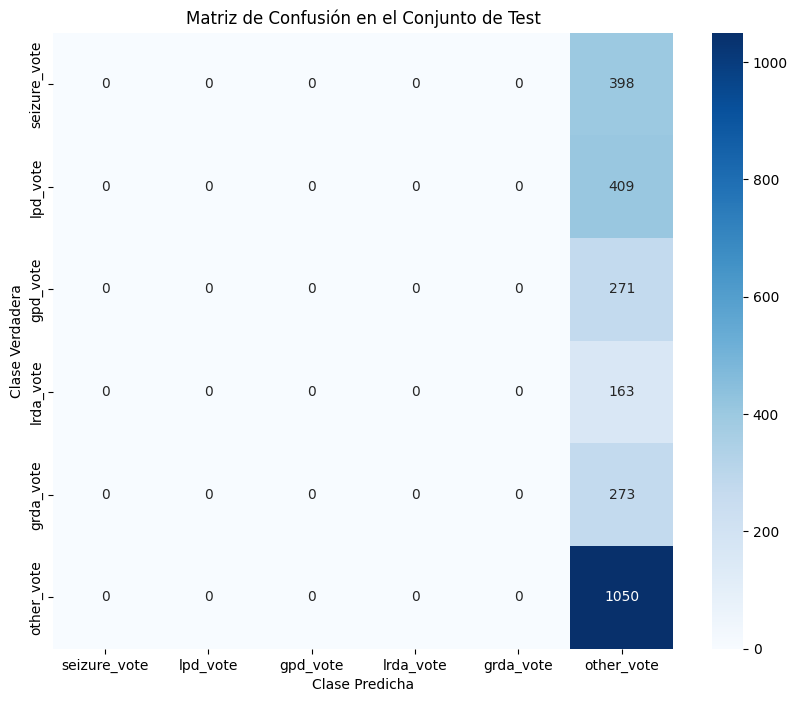


Análisis de Aciertos y Fallos (basado en la clase con mayor probabilidad):
Número total de muestras en test: 2564
Número de predicciones correctas (aciertos): 1050
Número de predicciones incorrectas (fallos): 1514
Tasa de Aciertos (Precisión): 0.4095
Tasa de Fallos: 0.5905

Confianza del Modelo en la Clase Verdadera:
Promedio de probabilidad asignada a la clase verdadera: 0.2637
(Un valor más alto sugiere que el modelo tiende a asignar una alta probabilidad a la clase correcta, incluso si no siempre es la probabilidad MÁS alta.)

¡Proceso completado!


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# (Ya deberías tener importados numpy as np y pandas as pd)
# --- PASO 7: Evaluar el mejor modelo en el conjunto de test ---
print("\nEvaluando el mejor modelo en el conjunto de test...")
# Obtener la pérdida y la precisión calculada por Keras durante model.evaluate()
test_loss, test_accuracy_keras = best_model.evaluate(X_test, y_test, verbose=0)
print(f"Pérdida en Test (calculada por Keras con KLDivergence): {test_loss:.4f}")
print(f"Precisión en Test (calculada por Keras): {test_accuracy_keras:.4f}")

# Obtener predicciones de probabilidad del modelo para el conjunto de test
y_pred_probs = best_model.predict(X_test)

# Convertir las probabilidades predichas a etiquetas de clase (índice de la clase con mayor probabilidad)
y_pred_classes = np.argmax(y_pred_probs, axis=1)

# Convertir las probabilidades verdaderas de y_test a etiquetas de clase
# Esto asume que y_test contiene probabilidades donde la clase "verdadera" es la que tiene el voto/probabilidad más alta,
# o que es una representación one-hot implícita.
y_true_classes = np.argmax(y_test, axis=1)

print("\n--- Métricas Detalladas de Evaluación en el Conjunto de Test ---")

# 1. Precisión General (confirmación con sklearn)
accuracy_sklearn = accuracy_score(y_true_classes, y_pred_classes)
print(f"\nPrecisión General (calculada por sklearn): {accuracy_sklearn:.4f}")

# 2. Reporte de Clasificación (Precisión, Recall, F1-score por clase)
# TARGETS es tu lista de nombres de clases, ej: ['seizure_vote', ..., 'other_vote']
print("\nReporte de Clasificación Detallado:")
try:
    report = classification_report(
        y_true_classes, y_pred_classes, target_names=TARGETS, zero_division=0
    )
    print(report)
except ValueError as e:
    print(
        f"No se pudo generar el reporte de clasificación completo (puede que algunas clases no estén presentes en y_true o y_pred): {e}"
    )
    print(
        "Asegúrate de que y_true_classes y y_pred_classes contengan etiquetas para las clases definidas en TARGETS."
    )


# 3. Matriz de Confusión
print("\nMatriz de Confusión:")
cm = confusion_matrix(y_true_classes, y_pred_classes)
# Asegurarse de que la matriz de confusión tenga dimensiones para todas las clases en TARGETS,
# incluso si algunas clases no tienen predicciones o verdaderos positivos.
# Esto es importante para la visualización correcta con las etiquetas.
num_all_classes = len(TARGETS)
if cm.shape[0] != num_all_classes or cm.shape[1] != num_all_classes:
    # Si cm es más pequeña, se puede rellenar, pero es mejor asegurarse de que las clases estén presentes.
    # Por ahora, solo la imprimimos. Para la visualización, es importante que las etiquetas coincidan.
    # Si hay clases sin muestras en y_true_classes o y_pred_classes, confusion_matrix puede dar una matriz más pequeña.
    # Para una visualización robusta, se podrían añadir etiquetas explícitas al heatmap basadas en las clases únicas presentes.
    # unique_labels = np.unique(np.concatenate((y_true_classes, y_pred_classes)))
    # cm_labels = [TARGETS[i] for i in unique_labels]
    print(cm)
    print(
        f"(Nota: La matriz de confusión podría no incluir todas las {num_all_classes} clases si algunas no están en y_true_classes o y_pred_classes)"
    )


# Visualizar la Matriz de Confusión
plt.figure(figsize=(10, 8))  # Ajusta el tamaño si es necesario
try:
    # Intentar usar todas las etiquetas de TARGETS. Si hay un desajuste de tamaño,
    # el usuario deberá inspeccionar cm y TARGETS.
    labels_for_heatmap = TARGETS
    if cm.shape[0] != len(TARGETS):  # Si la matriz es más pequeña por clases ausentes
        print(
            f"Advertencia: La matriz de confusión tiene {cm.shape[0]} clases, pero TARGETS tiene {len(TARGETS)}. "
            "La visualización podría no ser precisa o fallar. Considera filtrar TARGETS a clases presentes en los datos de test."
        )
        # Podrías intentar mostrar solo las etiquetas de las clases presentes si es necesario:
        # unique_ticks = sorted(np.unique(np.concatenate((y_true_classes, y_pred_classes))))
        # labels_for_heatmap = [TARGETS[i] for i in unique_ticks]
        # sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels_for_heatmap, yticklabels=labels_for_heatmap)

    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=labels_for_heatmap,
        yticklabels=labels_for_heatmap,
    )
    plt.xlabel("Clase Predicha")
    plt.ylabel("Clase Verdadera")
    plt.title("Matriz de Confusión en el Conjunto de Test")
    plt.show()
except Exception as e_plot:
    print(f"No se pudo graficar la matriz de confusión: {e_plot}")


# 4. Análisis de Aciertos vs. Fallos (tu métrica solicitada)
num_samples = len(y_true_classes)
num_correct_predictions = np.sum(
    y_true_classes == y_pred_classes
)  # Donde la clase predicha es la verdadera
num_incorrect_predictions = num_samples - num_correct_predictions

print(f"\nAnálisis de Aciertos y Fallos (basado en la clase con mayor probabilidad):")
print(f"Número total de muestras en test: {num_samples}")
print(f"Número de predicciones correctas (aciertos): {num_correct_predictions}")
print(f"Número de predicciones incorrectas (fallos): {num_incorrect_predictions}")
if num_samples > 0:
    print(
        f"Tasa de Aciertos (Precisión): {(num_correct_predictions / num_samples):.4f}"
    )
    print(f"Tasa de Fallos: {(num_incorrect_predictions / num_samples):.4f}")

# 5. Métrica Adicional: Confianza del Modelo en la Clase Verdadera
# Para cada muestra, tomamos la probabilidad que el modelo asignó a la que realmente era la clase correcta.
prob_assigned_to_true_class = y_pred_probs[np.arange(num_samples), y_true_classes]

if num_samples > 0:
    avg_prob_for_true_class = np.mean(prob_assigned_to_true_class)
    print(f"\nConfianza del Modelo en la Clase Verdadera:")
    print(
        f"Promedio de probabilidad asignada a la clase verdadera: {avg_prob_for_true_class:.4f}"
    )
    print(
        "(Un valor más alto sugiere que el modelo tiende a asignar una alta probabilidad a la clase correcta, incluso si no siempre es la probabilidad MÁS alta.)"
    )

print("\n¡Proceso completado!")
# Guardar el modelo final si se desea
# best_model.save("final_model_direct_pca_input.keras")

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight  # Para calcular pesos de clase
import keras_tuner as kt

# ----------- Configuración Global (mínima) -----------
TARGETS = [
    "seizure_vote",
    "lpd_vote",
    "gpd_vote",
    "lrda_vote",
    "grda_vote",
    "other_vote",
]
NUM_CLASSES = len(TARGETS)
SEED = 77

# Establecer semillas para reproducibilidad
tf.random.set_seed(SEED)
np.random.seed(SEED)

# Variable global para el número de componentes PCA, se definirá en __main__
NUM_PCA_COMPONENTS_ACTUAL = None

# ----------- Funciones para construir el modelo con extractores densos + BiLSTM -----------


def build_dense_feature_extractor(hp, input_tensor, name_prefix):
    """Construye un pequeño extractor de características MLP."""
    # Hiperparámetros para la primera capa densa del extractor
    dense1_units = hp.Int(
        f"{name_prefix}_dense1_units", min_value=32, max_value=256, step=32, default=128
    )
    dropout1_rate = hp.Float(
        f"{name_prefix}_dropout1_rate",
        min_value=0.0,
        max_value=0.5,
        step=0.1,
        default=0.2,
    )

    x = layers.Dense(dense1_units, activation="relu", name=f"{name_prefix}_dense1")(
        input_tensor
    )
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(
        x
    )  # Añadido BatchNormalization
    x = layers.Dropout(dropout1_rate, name=f"{name_prefix}_dropout1")(x)

    # Hiperparámetros para la segunda capa densa del extractor (opcional, podríamos hacerla más profunda)
    dense2_units = hp.Int(
        f"{name_prefix}_dense2_units", min_value=16, max_value=128, step=16, default=64
    )
    # Podríamos añadir un Choice para incluir o no esta segunda capa
    # if hp.Boolean(f'{name_prefix}_has_dense2', default=True):
    x = layers.Dense(dense2_units, activation="relu", name=f"{name_prefix}_dense2")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(
        x
    )  # Añadido BatchNormalization

    return x


def build_model_pca_ensemble(hp):
    global NUM_PCA_COMPONENTS_ACTUAL  # Acceder a la variable global
    if NUM_PCA_COMPONENTS_ACTUAL is None:
        raise ValueError(
            "NUM_PCA_COMPONENTS_ACTUAL no ha sido establecido. Asegúrate de que se defina en el flujo principal."
        )

    input_pca_layer = layers.Input(
        shape=(NUM_PCA_COMPONENTS_ACTUAL,), name="input_pca_features"
    )

    # Crear tres extractores de características densas diferentes
    # KerasTuner ajustará los hiperparámetros de cada uno de forma independiente gracias al 'name_prefix'
    extractor_out1 = build_dense_feature_extractor(hp, input_pca_layer, "extractor1")
    extractor_out2 = build_dense_feature_extractor(hp, input_pca_layer, "extractor2")
    extractor_out3 = build_dense_feature_extractor(hp, input_pca_layer, "extractor3")

    # Concatenar las salidas de los extractores
    merged_features = layers.Concatenate(name="concatenate_extractors")(
        [extractor_out1, extractor_out2, extractor_out3]
    )

    # Reshape para la entrada de la BiLSTM: (batch_size, 1 timestep, num_features_concatenadas)
    # El -1 en Reshape infiere automáticamente la dimensión de las características concatenadas.
    sequence_input = layers.Reshape((1, -1), name="reshape_to_sequence")(
        merged_features
    )

    # Cabeza BiLSTM
    lstm_units = hp.Int("lstm_units", min_value=32, max_value=256, step=32, default=128)
    lstm_l2 = hp.Float("lstm_l2", 1e-5, 1e-3, sampling="log", default=1e-4)

    x = layers.Bidirectional(
        layers.LSTM(
            lstm_units,
            return_sequences=False,
            kernel_regularizer=tf.keras.regularizers.l2(lstm_l2),
        ),
        name="bidirectional_lstm",
    )(sequence_input)

    # Dropout después de la BiLSTM
    bilstm_dropout_rate = hp.Float(
        "bilstm_dropout_rate", min_value=0.1, max_value=0.5, step=0.1, default=0.3
    )
    x = layers.Dropout(bilstm_dropout_rate, name="dropout_bilstm_output")(x)

    # Capa de salida
    output = layers.Dense(NUM_CLASSES, activation="softmax", name="output_softmax")(x)

    model = Model(inputs=input_pca_layer, outputs=output)

    # Optimizador
    learning_rate = hp.Float(
        "learning_rate", min_value=1e-5, max_value=1e-2, sampling="log", default=1e-4
    )
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

    # Compilar el modelo
    model.compile(
        optimizer=optimizer,
        loss=tf.keras.losses.KLDivergence(),
        metrics=[
            "accuracy",
            tf.keras.metrics.AUC(name="auc", multi_label=True, num_labels=NUM_CLASSES),
        ],
    )
    return model


# ----------- Función de Preprocesamiento del DataFrame a Tensores (adaptada para PCA) -----------
def preprocess_dataframe_to_tensors_pca(df, pca_feature_cols, target_cols, num_classes):
    # No se necesita 'desired_input_shape' aquí si el Input de Keras es (NUM_PCA_COMPONENTS_ACTUAL,)
    global NUM_PCA_COMPONENTS_ACTUAL  # Acceder a la variable global
    if NUM_PCA_COMPONENTS_ACTUAL is None:
        NUM_PCA_COMPONENTS_ACTUAL = len(pca_feature_cols)  # Establecer si aún no está

    if not all(col in df.columns for col in target_cols):
        missing_cols = [col for col in target_cols if col not in df.columns]
        raise ValueError(
            f"Las siguientes columnas objetivo no se encuentran en el DataFrame: {missing_cols}"
        )

    y_processed = df[target_cols].values.astype(np.float32)
    if y_processed.shape[1] != num_classes:
        raise ValueError(
            f"El número de columnas objetivo ({y_processed.shape[1]}) no coincide con NUM_CLASSES ({num_classes})."
        )

    if not all(col in df.columns for col in pca_feature_cols):
        missing_cols = [col for col in pca_feature_cols if col not in df.columns]
        raise ValueError(
            f"Las siguientes columnas de características PCA no se encuentran en el DataFrame: {missing_cols}"
        )

    feature_data = df[pca_feature_cols].values.astype(np.float32)

    # La forma de X_processed ahora será (num_samples, NUM_PCA_COMPONENTS_ACTUAL)
    # El modelo se encargará internamente del Reshape para la LSTM
    if feature_data.shape[1] != NUM_PCA_COMPONENTS_ACTUAL:
        raise ValueError(
            f"El número de características PCA extraídas ({feature_data.shape[1]}) "
            f"no coincide con NUM_PCA_COMPONENTS_ACTUAL ({NUM_PCA_COMPONENTS_ACTUAL})."
        )

    X_processed = feature_data
    return X_processed, y_processed


# ----------- Flujo Principal de Ejecución -----------
if __name__ == "__main__":
    BATCH_SIZE = 32
    global NUM_PCA_COMPONENTS_ACTUAL
    if (
        "train_scaled_df" not in locals()
        or train_scaled_df is None
        or train_scaled_df.empty
    ):
        raise ValueError(
            "La variable 'train_scaled_df' no está definida o está vacía. Debes cargar tus datos que contienen las características PCA y los targets."
        )

    # --- PASO 2: Define tus columnas de características PCA y objetivo ---
    USER_DEFINED_PCA_FEATURE_COLS = [
        col for col in train_scaled_df.columns if col.startswith("PCA_Component_")
    ]

    if not USER_DEFINED_PCA_FEATURE_COLS:
        raise ValueError(
            "No se encontraron columnas con el prefijo 'PCA_Component_' en 'train_scaled_df'. "
            "Verifica los nombres de las columnas de características PCA."
        )

    # Establecer NUM_PCA_COMPONENTS_ACTUAL globalmente
    NUM_PCA_COMPONENTS_ACTUAL = len(USER_DEFINED_PCA_FEATURE_COLS)

    print(f"Se identificaron {NUM_PCA_COMPONENTS_ACTUAL} columnas PCA.")
    print(
        f"La forma de entrada para los extractores densos será: ({NUM_PCA_COMPONENTS_ACTUAL},)"
    )

    # USER_DEFINED_TARGET_COLS ya debería estar definido globalmente como TARGETS
    # USER_DEFINED_TARGET_COLS = TARGETS

    all_needed_cols = (
        USER_DEFINED_PCA_FEATURE_COLS + TARGETS
    )  # Usar TARGETS directamente
    if not all(col in train_scaled_df.columns for col in all_needed_cols):
        missing = [col for col in all_needed_cols if col not in train_scaled_df.columns]
        raise ValueError(
            f"Faltan columnas en 'train_scaled_df': {missing}. Revisa los nombres de columnas generados y TARGETS."
        )

    # --- PASO 3: División de Datos ---
    # Asegurarse que las columnas target existen para la estratificación
    if not all(target_col in train_scaled_df.columns for target_col in TARGETS):
        raise ValueError(
            f"Una o más columnas objetivo de TARGETS ('{TARGETS}') no se encuentran en train_scaled_df para la estratificación."
        )

    y_stratify_labels = np.argmax(train_scaled_df[TARGETS].values, axis=1)

    # Considerar si hay suficientes muestras para estratificar por cada clase
    unique_strat_labels, counts_strat_labels = np.unique(
        y_stratify_labels, return_counts=True
    )
    can_stratify_main = (
        all(counts_strat_labels >= 2) if len(counts_strat_labels) > 0 else False
    )  # Mínimo 2 muestras por clase para estratificar

    main_train_df, test_df = train_test_split(
        train_scaled_df[all_needed_cols],
        test_size=0.15,
        random_state=SEED,
        stratify=y_stratify_labels if can_stratify_main else None,
    )
    if not can_stratify_main:
        print(
            "Advertencia: No se pudo aplicar estratificación en la división principal (main/test) debido a pocas muestras en algunas clases."
        )

    y_stratify_main_train_labels = np.argmax(main_train_df[TARGETS].values, axis=1)
    unique_strat_main_train_labels, counts_strat_main_train_labels = np.unique(
        y_stratify_main_train_labels, return_counts=True
    )
    can_stratify_secondary = (
        all(counts_strat_main_train_labels >= 2)
        if len(counts_strat_main_train_labels) > 0
        else False
    )

    final_train_df, val_df = train_test_split(
        main_train_df,
        test_size=0.20,  # 20% de main_train_df
        random_state=SEED,
        stratify=y_stratify_main_train_labels if can_stratify_secondary else None,
    )
    if not can_stratify_secondary:
        print(
            "Advertencia: No se pudo aplicar estratificación en la división secundaria (train/validation) debido a pocas muestras en algunas clases."
        )

    print(
        f"División: {len(final_train_df)} entrenamiento, {len(val_df)} validación, {len(test_df)} test."
    )

    # --- PASO 4: Procesar DataFrames a Tensores usando la función adaptada ---
    print("\nProcesando DataFrame de entrenamiento a tensores...")
    X_train, y_train = preprocess_dataframe_to_tensors_pca(
        final_train_df,
        pca_feature_cols=USER_DEFINED_PCA_FEATURE_COLS,
        target_cols=TARGETS,
        num_classes=NUM_CLASSES,
    )
    print(f"Forma final X_train: {X_train.shape}, y_train: {y_train.shape}")

    print("\nProcesando DataFrame de validación a tensores...")
    X_val, y_val = preprocess_dataframe_to_tensors_pca(
        val_df,
        pca_feature_cols=USER_DEFINED_PCA_FEATURE_COLS,
        target_cols=TARGETS,
        num_classes=NUM_CLASSES,
    )
    print(f"Forma final X_val: {X_val.shape}, y_val: {y_val.shape}")

    print("\nProcesando DataFrame de test a tensores...")
    X_test, y_test = preprocess_dataframe_to_tensors_pca(
        test_df,
        pca_feature_cols=USER_DEFINED_PCA_FEATURE_COLS,
        target_cols=TARGETS,
        num_classes=NUM_CLASSES,
    )
    print(f"Forma final X_test: {X_test.shape}, y_test: {y_test.shape}")

    # --- Calcular Pesos de Clase ---
    y_integers_for_weights = np.argmax(y_train, axis=1)
    unique_classes_in_train = np.unique(y_integers_for_weights)

    if (
        len(unique_classes_in_train) < NUM_CLASSES and len(y_train) > 0
    ):  # Solo calcular si hay clases en y_train
        print(
            f"Advertencia: Solo {len(unique_classes_in_train)} de {NUM_CLASSES} clases están presentes en y_train después del split."
        )
        print(
            f"Clases presentes en y_train para cálculo de pesos: {unique_classes_in_train}"
        )

    if len(y_integers_for_weights) > 0 and len(unique_classes_in_train) > 0:
        class_weights_values = class_weight.compute_class_weight(
            class_weight="balanced",
            classes=unique_classes_in_train,  # Clases realmente presentes
            y=y_integers_for_weights,
        )
        class_weights = {
            i: 1.0 for i in range(NUM_CLASSES)
        }  # Inicializar todos los pesos a 1.0
        for i, class_idx in enumerate(unique_classes_in_train):
            class_weights[class_idx] = class_weights_values[i]
    else:
        print(
            "Advertencia: y_train está vacío o no contiene clases para calcular pesos. Usando pesos de clase = 1.0 para todas."
        )
        class_weights = {i: 1.0 for i in range(NUM_CLASSES)}

    print("\nPesos de clase calculados:")
    for i, target_name in enumerate(TARGETS):
        print(f"  Clase {i} ({target_name}): {class_weights.get(i, 1.0):.2f}")

    # --- PASO 5: Configuración y Búsqueda de Hiperparámetros con KerasTuner ---
    build_fn_for_tuner = lambda hp: build_model_pca_ensemble(
        hp
    )  # Asume que build_model_pca_ensemble está definida

    tuner_objective_name = "val_loss"  # KLDivergence en el conjunto de validación
    tuner = kt.BayesianOptimization(
        build_fn_for_tuner,
        objective=kt.Objective(tuner_objective_name, direction="min"),  # MINIMIZAR KLD
        max_trials=50,  # O el número de trials que desees
        executions_per_trial=1,
        directory="keras_tuner_pca_dense_ensemble_dir_kld",  # Podrías cambiar el directorio
        project_name="hms_pca_dense_lstm_v_kld",  # Podrías cambiar el nombre del proyecto
        overwrite=True,
        seed=SEED,
    )
    print(f"\nKerasTuner optimizará para: {tuner_objective_name} (direction: min)")

    print("\nIniciando búsqueda de hiperparámetros...")
    tuner_callbacks = [
        EarlyStopping(
            monitor="val_loss",
            patience=5,
            mode="min",
            verbose=1,
            restore_best_weights=True,
        )
    ]

    tuner.search(
        X_train,
        y_train,
        epochs=30,  # AUMENTA para búsqueda real (ej. 50-200). EarlyStopping controlará.
        validation_data=(X_val, y_val),
        callbacks=tuner_callbacks,
        batch_size=BATCH_SIZE,
        class_weight=class_weights,
    )

    # --- PASO 6: Obtener el mejor modelo y entrenarlo ---
    best_hps_list = tuner.get_best_hyperparameters(num_trials=1)
    if not best_hps_list:
        print(
            "ADVERTENCIA: KerasTuner no encontró ningún hiperparámetro 'mejor'. Esto puede suceder si todos los trials fallaron o fueron interrumpidos."
        )
        print("Por favor, revisa los logs del tuner. Saliendo.")
        # Aquí podrías decidir qué hacer, por ejemplo, salir o usar HPs por defecto.
        # exit() # Descomenta para salir si es crítico
        # Para continuar con HPs por defecto (si build_model_pca_ensemble tiene defaults para todo):
        print(
            "Intentando construir un modelo con hiperparámetros por defecto (si están definidos en build_model_pca_ensemble)..."
        )
        default_hp = (
            kt.HyperParameters()
        )  # Crea un objeto HP vacío, los defaults de build_model_pca_ensemble se usarán
        best_model = build_model_pca_ensemble(default_hp)
    else:
        best_hps = best_hps_list[0]
        print("\nMejores hiperparámetros encontrados:")
        for hp_name in best_hps.values:
            print(f"- {hp_name}: {best_hps.get(hp_name)}")
        best_model = build_model_pca_ensemble(best_hps)

    print("\nEntrenando el mejor modelo encontrado...")
    # Aumentar epochs y/o patience para el entrenamiento final del mejor modelo
    history = best_model.fit(
        X_train,
        y_train,
        epochs=500,  # AUMENTA para entrenamiento real (ej. 100-300). EarlyStopping controlará.
        validation_data=(X_val, y_val),
        callbacks=[
            EarlyStopping(
                monitor="val_loss",
                mode="min",
                patience=10,
                verbose=1,
                restore_best_weights=True,
            )
        ],
        batch_size=BATCH_SIZE,
        class_weight=class_weights,
    )

    # --- PASO 7: Evaluar el mejor modelo en el conjunto de test ---
    if X_test.shape[0] > 0:  # Solo evaluar si hay datos de test
        print("\nEvaluando el mejor modelo en el conjunto de test...")
        results = best_model.evaluate(X_test, y_test, verbose=1)
        print("\nResultados en Test:")
        for name, value in zip(best_model.metrics_names, results):
            print(f"{name}: {value:.4f}")

        # --- Adicional: Reporte de Clasificación más detallado ---
        from sklearn.metrics import (
            classification_report,
            roc_auc_score,
        )  # Mover importación aquí por si no se usa

        y_pred_probs = best_model.predict(X_test)
        y_pred_classes = np.argmax(y_pred_probs, axis=1)
        y_true_classes = np.argmax(y_test, axis=1)

        print("\nInforme de Clasificación Detallado (basado en la clase más probable):")
        # Asegurar que labels en classification_report cubra todas las clases posibles
        report_labels = np.arange(NUM_CLASSES)
        # Si alguna clase no está en y_true_classes o y_pred_classes, zero_division ayuda
        print(
            classification_report(
                y_true_classes,
                y_pred_classes,
                target_names=TARGETS,
                labels=report_labels,
                zero_division=0,
            )
        )

        try:
            # Asegurar que y_test tenga el formato correcto para roc_auc_score (probabilidades o one-hot)
            # y y_pred_probs son las probabilidades predichas
            auc_macro_ovr = roc_auc_score(
                y_test, y_pred_probs, average="macro", multi_class="ovr"
            )
            print(f"AUC (macro OVR) en Test (sklearn): {auc_macro_ovr:.4f}")
        except ValueError as e:
            print(f"No se pudo calcular AUC con sklearn.metrics.roc_auc_score: {e}")
            print(
                "Esto puede ocurrir si y_test no es compatible con el formato esperado (ej. no todas las clases presentes en y_test o y_pred después de la división y predicción)."
            )
    else:
        print("\nNo hay datos de test para evaluar.")

    print("\n¡Proceso completado!")

Trial 50 Complete [00h 00m 48s]
val_loss: 1.3791199922561646

Best val_loss So Far: 1.327536702156067
Total elapsed time: 00h 34m 31s

Mejores hiperparámetros encontrados:
- extractor1_dense1_units: 256
- extractor1_dropout1_rate: 0.30000000000000004
- extractor1_dense2_units: 96
- extractor2_dense1_units: 192
- extractor2_dropout1_rate: 0.1
- extractor2_dense2_units: 64
- extractor3_dense1_units: 32
- extractor3_dropout1_rate: 0.30000000000000004
- extractor3_dense2_units: 96
- lstm_units: 160
- lstm_l2: 2.197507554583798e-05
- bilstm_dropout_rate: 0.30000000000000004
- learning_rate: 2.8107390162256233e-05

Entrenando el mejor modelo encontrado...
Epoch 1/500
364/364 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - accuracy: 0.1939 - auc: 0.5105 - loss: 1.4323 - val_accuracy: 0.1525 - val_auc: 0.5396 - val_loss: 1.4429
Epoch 2/500
364/364 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.2675 - auc: 0.5327 - loss: 1.4109 - val_accuracy: 0.3676 - val_auc: 0.5327 - val_loss: 1.4228
Epoch 3/500
364/364 

In [ ]:
import numpy as np
import pandas as pd  # Para el DataFrame de resumen opcional

# import tensorflow as tf # No es estrictamente necesario aquí si 'best_model' ya es un modelo Keras
from sklearn.metrics import roc_auc_score, classification_report, brier_score_loss

# ----------- INICIO: Función y Bloque para Métricas Detalladas -----------
# ASUME QUE LAS SIGUIENTES VARIABLES YA EXISTEN EN TU ENTORNO:
# best_model: Tu modelo Keras entrenado y compilado.
# X_train, y_train: Tus datos de entrenamiento (NumPy arrays), y_train son probabilidades.
# X_test, y_test: Tus datos de prueba (NumPy arrays), y_test son probabilidades.
# TARGETS: Lista de nombres de tus clases objetivo (ej. ['claseA', 'claseB', ...]).
# NUM_CLASSES: Número total de clases.


def display_and_collect_metrics(
    model, X_data, y_true_probs, set_name, class_names_list, num_total_classes
):
    """
    Calcula, muestra y devuelve un diccionario de métricas para un conjunto de datos dado.
    """
    print(f"\n--- Métricas DETALLADAS para el Conjunto de {set_name.upper()} ---")
    metrics_results = {"set": set_name}

    # 1. Evaluación con model.evaluate() (para Loss KLD, Accuracy, y AUC compilado)
    #    Estas son las métricas con las que se compiló el modelo.
    print(f"Evaluando con model.evaluate() en {set_name}...")
    eval_results = model.evaluate(X_data, y_true_probs, verbose=0)
    for metric_name, value in zip(model.metrics_names, eval_results):
        print(f"  {metric_name.capitalize()} (Keras evaluate): {value:.4f}")
        metrics_results[f"keras_{metric_name}"] = value
        if metric_name == "loss":  # Asumiendo que 'loss' es KLD, ya que así se compiló
            metrics_results["KLDivergence"] = value

    # 2. Predecir probabilidades para métricas de sklearn
    print(f"Generando predicciones de probabilidad en {set_name}...")
    y_pred_probs = model.predict(X_data, verbose=0)

    # 3. AUC (Macro OVR) con Scikit-learn
    try:
        # y_true_probs y y_pred_probs deben tener la misma forma (n_samples, n_classes)
        auc_sklearn = roc_auc_score(
            y_true_probs, y_pred_probs, average="macro", multi_class="ovr"
        )
        print(f"  AUC (Macro OVR, sklearn): {auc_sklearn:.4f}")
        metrics_results["sklearn_auc_macro_ovr"] = auc_sklearn
    except ValueError as e:
        print(
            f"  ADVERTENCIA: No se pudo calcular AUC (sklearn) para {set_name}. Error: {e}"
        )
        print(
            "  Esto puede ocurrir si no todas las clases están presentes en y_true_probs o y_pred_probs, o si los datos no son adecuados."
        )
        metrics_results["sklearn_auc_macro_ovr"] = np.nan

    # 4. Brier Score Promedio por Clase (sklearn)
    # Mide el error cuadrático medio entre la probabilidad predicha y el resultado real.
    # Un valor más bajo es mejor, indica que las probabilidades están mejor calibradas.
    try:
        brier_scores_per_class_list = []
        for i in range(num_total_classes):
            # brier_score_loss espera que y_true sea la probabilidad verdadera para esa clase (entre 0 y 1)
            brier_scores_per_class_list.append(
                brier_score_loss(y_true_probs[:, i], y_pred_probs[:, i])
            )
        avg_brier_score = np.mean(brier_scores_per_class_list)
        print(f"  Brier Score Promedio (por clase, sklearn): {avg_brier_score:.4f}")
        metrics_results["brier_score_avg_sklearn"] = avg_brier_score
    except Exception as e:
        print(
            f"  ADVERTENCIA: No se pudo calcular el Brier Score Promedio (sklearn) para {set_name}. Error: {e}"
        )
        metrics_results["brier_score_avg_sklearn"] = np.nan

    # 5. Error Cuadrático Medio (MSE) de los Vectores de Probabilidad
    # Mide directamente la diferencia cuadrática promedio entre los vectores de probabilidad completos.
    try:
        mse_prob_vectors = np.mean(np.square(y_true_probs - y_pred_probs))
        print(f"  MSE de Probabilidades (vectorial): {mse_prob_vectors:.4f}")
        metrics_results["mse_prob_vectors"] = mse_prob_vectors
    except Exception as e:
        print(
            f"  ADVERTENCIA: No se pudo calcular el MSE de Probabilidades para {set_name}. Error: {e}"
        )
        metrics_results["mse_prob_vectors"] = np.nan

    # 6. Informe de Clasificación (basado en la clase con mayor probabilidad)
    print(f"\n  Informe de Clasificación para {set_name} (basado en argmax):")
    # Convertir probabilidades a etiquetas de clase (la que tiene mayor probabilidad)
    y_true_classes_argmax = np.argmax(y_true_probs, axis=1)
    y_pred_classes_argmax = np.argmax(y_pred_probs, axis=1)
    report_labels = np.arange(
        num_total_classes
    )  # Asegurar que todas las clases se consideren en el informe

    try:
        class_report = classification_report(
            y_true_classes_argmax,
            y_pred_classes_argmax,
            target_names=class_names_list,
            labels=report_labels,
            zero_division=0,  # Evita warnings si alguna clase no tiene predicciones/verdaderos
        )
        print(class_report)
        # Podrías guardar el informe como un string si lo necesitas:
        # metrics_results["classification_report_str"] = class_report
    except Exception as e:
        print(
            f"  ADVERTENCIA: No se pudo generar el Informe de Clasificación para {set_name}. Error: {e}"
        )

    return metrics_results


# --- Bloque para llamar a la función de métricas ---
# Este bloque asume que las variables necesarias ya están definidas en tu script.
# (best_model, X_train, y_train, X_test, y_test, TARGETS, NUM_CLASSES)

# Comprobación simple de existencia de variables (puedes quitarla si estás seguro)
if (
    "best_model" in locals()
    and "X_train" in locals()
    and "y_train" in locals()
    and "X_test" in locals()
    and "y_test" in locals()
    and "TARGETS" in locals()
    and "NUM_CLASSES" in locals()
):

    print("\n\n=========================================================")
    print(" INICIO DE EVALUACIÓN DETALLADA DEL MODELO ")
    print("=========================================================")

    all_collected_metrics_detailed = (
        []
    )  # Lista para guardar los diccionarios de métricas

    # Calcular y mostrar métricas para el conjunto de ENTRENAMIENTO
    if X_train.shape[0] > 0:  # Solo si hay datos de entrenamiento
        metrics_train_results_detailed = display_and_collect_metrics(
            best_model, X_train, y_train, "Entrenamiento", TARGETS, NUM_CLASSES
        )
        all_collected_metrics_detailed.append(metrics_train_results_detailed)
    else:
        print(
            "ADVERTENCIA: X_train está vacío o no definido. Saltando métricas detalladas de entrenamiento."
        )

    # Calcular y mostrar métricas para el conjunto de PRUEBA
    if X_test.shape[0] > 0:  # Solo si hay datos de prueba
        metrics_test_results_detailed = display_and_collect_metrics(
            best_model, X_test, y_test, "Prueba", TARGETS, NUM_CLASSES
        )
        all_collected_metrics_detailed.append(metrics_test_results_detailed)
    else:
        print(
            "ADVERTENCIA: X_test está vacío o no definido. Saltando métricas detalladas de prueba."
        )

    # Opcional: Convertir las métricas recolectadas a un DataFrame de Pandas para fácil visualización o guardado
    if all_collected_metrics_detailed:
        metrics_summary_df_detailed = pd.DataFrame(all_collected_metrics_detailed)
        print("\n\n--- Resumen de Métricas DETALLADAS en DataFrame ---")
        # Usar .to_string() para asegurar que se muestren todas las columnas si son muchas
        print(metrics_summary_df_detailed.to_string())
        # Si quieres guardarlo en un CSV:
        # metrics_summary_df_detailed.to_csv("resumen_metricas_detalladas_modelo.csv", index=False)

    print("\n=========================================================")
    print(" FIN DE EVALUACIÓN DETALLADA DEL MODELO ")
    print("=========================================================")

else:
    print(
        "ADVERTENCIA: Faltan variables necesarias (best_model, X_train, y_train, X_test, y_test, TARGETS, NUM_CLASSES) para calcular las métricas detalladas."
    )
    print(
        "Asegúrate de que tu modelo esté entrenado y los datos estén cargados correctamente."
    )

# ----------- FIN: Función y Bloque para Métricas Detalladas -----------



 INICIO DE EVALUACIÓN DETALLADA DEL MODELO 

--- Métricas DETALLADAS para el Conjunto de ENTRENAMIENTO ---
Evaluando con model.evaluate() en Entrenamiento...
  Loss (Keras evaluate): 1.3500
  Compile_metrics (Keras evaluate): 0.3913
Generando predicciones de probabilidad en Entrenamiento...
  ADVERTENCIA: No se pudo calcular AUC (sklearn) para Entrenamiento. Error: continuous-multioutput format is not supported
  Esto puede ocurrir si no todas las clases están presentes en y_true_probs o y_pred_probs, o si los datos no son adecuados.
  ADVERTENCIA: No se pudo calcular el Brier Score Promedio (sklearn) para Entrenamiento. Error: Only binary classification is supported. The type of the target is continuous.
  MSE de Probabilidades (vectorial): 0.0978

  Informe de Clasificación para Entrenamiento (basado en argmax):
              precision    recall  f1-score   support

seizure_vote       0.26      0.28      0.27      1846
    lpd_vote       0.00      0.00      0.00      1756
    gpd_v

In [20]:
y_pred_probs

array([[0.21367656, 0.14253448, 0.10879886, 0.15542309, 0.15620825,
        0.22335874],
       [0.21774383, 0.1414617 , 0.10693158, 0.15450089, 0.155269  ,
        0.224093  ],
       [0.21507457, 0.142191  , 0.1081298 , 0.1551689 , 0.15588355,
        0.2235521 ],
       ...,
       [0.21448806, 0.14233   , 0.10840418, 0.15527846, 0.15602472,
        0.22347462],
       [0.21369019, 0.14253062, 0.10878552, 0.15543011, 0.15621413,
        0.2233494 ],
       [0.21907195, 0.14123133, 0.10612556, 0.15460417, 0.15501027,
        0.22395669]], dtype=float32)

In [ ]:
import numpy as np
import pandas as pd  # Para el DataFrame de resumen opcional

# import tensorflow as tf # No es estrictamente necesario aquí si 'best_model' ya es un modelo Keras
from sklearn.metrics import roc_auc_score, classification_report, brier_score_loss

# ----------- INICIO: Función para Métricas Detalladas (Actualizada) -----------
# ASUME QUE LAS SIGUIENTES VARIABLES YA EXISTEN EN TU ENTORNO CUANDO LLAMES ESTA FUNCIÓN:
# model: Tu modelo Keras entrenado y compilado.
# X_data: Las características del conjunto de datos a evaluar (ej. X_train o X_test).
# y_true_probs: Las probabilidades verdaderas del conjunto de datos (ej. y_train o y_test).
# set_name: Un string para nombrar el conjunto (ej. "Entrenamiento" o "Prueba").
# class_names_list: Lista de nombres de tus clases objetivo (ej. TARGETS).
# num_total_classes: Número total de clases (ej. NUM_CLASSES).


def display_and_collect_metrics_extended(
    model, X_data, y_true_probs, set_name, class_names_list, num_total_classes
):
    """
    Calcula, muestra y devuelve un diccionario de métricas para un conjunto de datos dado,
    incluyendo análisis de distribución de predicciones.
    """
    print(
        f"\n--- Métricas DETALLADAS y Análisis de Predicciones para el Conjunto de {set_name.upper()} ---"
    )
    metrics_results = {"set": set_name}

    if X_data is None or X_data.shape[0] == 0:
        print(f"  No hay datos en el conjunto de {set_name} para analizar.")
        return metrics_results  # Devuelve el diccionario parcialmente lleno o vacío

    # 1. Evaluación con model.evaluate() (para Loss KLD, Accuracy, y AUC compilado)
    print(f"Evaluando con model.evaluate() en {set_name}...")
    eval_results = model.evaluate(X_data, y_true_probs, verbose=0)
    for metric_name, value in zip(model.metrics_names, eval_results):
        print(f"  {metric_name.capitalize()} (Keras evaluate): {value:.4f}")
        metrics_results[f"keras_{metric_name}"] = value
        if metric_name == "loss":
            metrics_results["KLDivergence"] = value

    # 2. Predecir probabilidades para métricas de sklearn y análisis adicional
    print(f"Generando predicciones de probabilidad en {set_name}...")
    y_pred_probs = model.predict(X_data, verbose=0)

    if y_pred_probs is None or y_pred_probs.shape[0] == 0:
        print(f"  No se generaron predicciones para el conjunto de {set_name}.")
        # Aún podríamos tener las métricas de Keras, así que continuamos y devolvemos lo que tengamos.
    else:
        # 3. AUC (Macro OVR) con Scikit-learn
        try:
            auc_sklearn = roc_auc_score(
                y_true_probs, y_pred_probs, average="macro", multi_class="ovr"
            )
            print(f"  AUC (Macro OVR, sklearn): {auc_sklearn:.4f}")
            metrics_results["sklearn_auc_macro_ovr"] = auc_sklearn
        except ValueError as e:
            print(
                f"  ADVERTENCIA: No se pudo calcular AUC (sklearn) para {set_name}. Error: {e}"
            )
            metrics_results["sklearn_auc_macro_ovr"] = np.nan

        # 4. Brier Score Promedio por Clase (sklearn)
        try:
            brier_scores_per_class_list = []
            for i in range(num_total_classes):
                brier_scores_per_class_list.append(
                    brier_score_loss(y_true_probs[:, i], y_pred_probs[:, i])
                )
            avg_brier_score = np.mean(brier_scores_per_class_list)
            print(f"  Brier Score Promedio (por clase, sklearn): {avg_brier_score:.4f}")
            metrics_results["brier_score_avg_sklearn"] = avg_brier_score
        except Exception as e:
            print(
                f"  ADVERTENCIA: No se pudo calcular el Brier Score Promedio (sklearn) para {set_name}. Error: {e}"
            )
            metrics_results["brier_score_avg_sklearn"] = np.nan

        # 5. Error Cuadrático Medio (MSE) de los Vectores de Probabilidad
        try:
            mse_prob_vectors = np.mean(np.square(y_true_probs - y_pred_probs))
            print(f"  MSE de Probabilidades (vectorial): {mse_prob_vectors:.4f}")
            metrics_results["mse_prob_vectors"] = mse_prob_vectors
        except Exception as e:
            print(
                f"  ADVERTENCIA: No se pudo calcular el MSE de Probabilidades para {set_name}. Error: {e}"
            )
            metrics_results["mse_prob_vectors"] = np.nan

        # 6. Informe de Clasificación (basado en la clase con mayor probabilidad)
        print(f"\n  Informe de Clasificación para {set_name} (basado en argmax):")
        y_true_classes_argmax = np.argmax(y_true_probs, axis=1)
        y_pred_classes_argmax = np.argmax(y_pred_probs, axis=1)
        report_labels = np.arange(num_total_classes)

        try:
            class_report = classification_report(
                y_true_classes_argmax,
                y_pred_classes_argmax,
                target_names=class_names_list,
                labels=report_labels,
                zero_division=0,
            )
            print(class_report)
        except Exception as e:
            print(
                f"  ADVERTENCIA: No se pudo generar el Informe de Clasificación para {set_name}. Error: {e}"
            )

        # 7. Análisis Adicional de Distribución de Predicciones
        print(
            f"\n  Análisis Adicional de Distribución de Predicciones para {set_name}:"
        )

        # 7.1 Calcular la probabilidad promedio predicha para cada clase
        avg_pred_probs_per_class = np.mean(y_pred_probs, axis=0)
        print("\n    Probabilidad Promedio Predicha por Clase:")
        if len(class_names_list) == len(avg_pred_probs_per_class):
            for i, class_name in enumerate(class_names_list):
                print(f"      {class_name}: {avg_pred_probs_per_class[i]:.4f}")
            metrics_results["avg_pred_probs_per_class"] = (
                avg_pred_probs_per_class.tolist()
            )  # Opcional: guardar
        else:
            print(f"      {avg_pred_probs_per_class}")

        # 7.2 Calcular cuántas veces cada clase fue predicha con la mayor probabilidad
        predicted_class_indices = np.argmax(y_pred_probs, axis=1)
        counts_highest_prob_per_class = np.bincount(
            predicted_class_indices, minlength=num_total_classes
        )
        print(
            "\n    Número de Veces que Cada Clase fue Predicha con la Mayor Probabilidad:"
        )
        if len(class_names_list) == len(counts_highest_prob_per_class):
            for i, class_name in enumerate(class_names_list):
                print(
                    f"      {class_name}: {counts_highest_prob_per_class[i]} veces (de {X_data.shape[0]} muestras)"
                )
            metrics_results["counts_max_pred_per_class"] = (
                counts_highest_prob_per_class.tolist()
            )  # Opcional: guardar
        else:
            print(f"      {counts_highest_prob_per_class}")

    return metrics_results


# --- Bloque para llamar a la función de métricas (DEBE IR DESPUÉS DEL ENTRENAMIENTO DE 'best_model') ---
# Este bloque asume que las variables necesarias ya están definidas en tu script principal.
# (best_model, X_train, y_train, X_test, y_test, TARGETS, NUM_CLASSES)

# Comprobación simple de existencia de variables
# (esta es la parte que te da la ADVERTENCIA si las variables no existen cuando la ejecutas aisladamente)
if (
    "best_model" in locals()
    and "X_train" in locals()
    and "y_train" in locals()
    and "X_test" in locals()
    and "y_test" in locals()
    and "TARGETS" in locals()
    and "NUM_CLASSES" in locals()
):

    print(
        "\n\n================================================================================"
    )
    print(" INICIO DE EVALUACIÓN DETALLADA DEL MODELO Y ANÁLISIS DE PREDICCIONES ")
    print(
        "================================================================================"
    )

    all_collected_metrics_detailed = []

    # Calcular y mostrar métricas para el conjunto de ENTRENAMIENTO
    if (
        X_train is not None
        and X_train.shape[0] > 0
        and y_train is not None
        and y_train.shape[0] > 0
    ):
        metrics_train_results_detailed = display_and_collect_metrics_extended(
            best_model, X_train, y_train, "Entrenamiento", TARGETS, NUM_CLASSES
        )
        all_collected_metrics_detailed.append(metrics_train_results_detailed)
    else:
        print(
            "ADVERTENCIA: X_train o y_train no están definidos o están vacíos. Saltando métricas detalladas de entrenamiento."
        )

    # Calcular y mostrar métricas para el conjunto de PRUEBA
    if (
        X_test is not None
        and X_test.shape[0] > 0
        and y_test is not None
        and y_test.shape[0] > 0
    ):
        metrics_test_results_detailed = display_and_collect_metrics_extended(
            best_model, X_test, y_test, "Prueba", TARGETS, NUM_CLASSES
        )
        all_collected_metrics_detailed.append(metrics_test_results_detailed)
    else:
        print(
            "ADVERTENCIA: X_test o y_test no están definidos o están vacíos. Saltando métricas detalladas de prueba."
        )

    # Opcional: Convertir las métricas recolectadas a un DataFrame de Pandas
    if all_collected_metrics_detailed:
        metrics_summary_df_detailed = pd.DataFrame(all_collected_metrics_detailed)
        # Filtrar columnas que no son listas para una mejor visualización inicial del DataFrame principal
        # (las listas se pueden inspeccionar por separado si se guardan en metrics_results)
        cols_to_show = [
            col
            for col in metrics_summary_df_detailed.columns
            if not isinstance(metrics_summary_df_detailed[col].iloc[0], list)
        ]
        print("\n\n--- Resumen de Métricas Escalares DETALLADAS en DataFrame ---")
        if cols_to_show:
            print(metrics_summary_df_detailed[cols_to_show].to_string())
        else:
            print("No hay métricas escalares para mostrar en el DataFrame de resumen.")
        # Si quieres guardar el DataFrame completo (incluyendo las listas como columnas, si las añadiste):
        # metrics_summary_df_detailed.to_csv("resumen_metricas_completas_modelo.csv", index=False)

    print(
        "\n================================================================================"
    )
    print(" FIN DE EVALUACIÓN DETALLADA DEL MODELO Y ANÁLISIS DE PREDICCIONES ")
    print(
        "================================================================================"
    )

else:
    print(
        "ADVERTENCIA: Faltan variables necesarias (best_model, X_train, y_train, X_test, y_test, TARGETS, NUM_CLASSES) para calcular las métricas detalladas."
    )
    print(
        "Asegúrate de que tu modelo esté entrenado y los datos estén cargados correctamente antes de ejecutar este bloque de análisis."
    )

# ----------- FIN: Función y Bloque para Métricas Detalladas (Actualizada) -----------



 INICIO DE EVALUACIÓN DETALLADA DEL MODELO Y ANÁLISIS DE PREDICCIONES 

--- Métricas DETALLADAS y Análisis de Predicciones para el Conjunto de ENTRENAMIENTO ---
Evaluando con model.evaluate() en Entrenamiento...
  Loss (Keras evaluate): 1.3500
  Compile_metrics (Keras evaluate): 0.3913
Generando predicciones de probabilidad en Entrenamiento...
  ADVERTENCIA: No se pudo calcular AUC (sklearn) para Entrenamiento. Error: continuous-multioutput format is not supported
  ADVERTENCIA: No se pudo calcular el Brier Score Promedio (sklearn) para Entrenamiento. Error: Only binary classification is supported. The type of the target is continuous.
  MSE de Probabilidades (vectorial): 0.0978

  Informe de Clasificación para Entrenamiento (basado en argmax):
              precision    recall  f1-score   support

seizure_vote       0.26      0.28      0.27      1846
    lpd_vote       0.00      0.00      0.00      1756
    gpd_vote       0.19      0.00      0.01      1234
   lrda_vote       0.00   